In [1]:
import os
import sys
import string
import subprocess
import xarray as xr

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import netCDF4
from netCDF4 import MFDataset
from netCDF4 import Dataset
from IPython.display import display, Math, Latex
import pandas as pd
from matplotlib import cm
import datetime
from datetime import datetime, timedelta
from operator import * 
from matplotlib.dates import DateFormatter


In [2]:
os.getcwd()

'/Users/bilir/Desktop/CardamomScratch'

In [3]:
LandFrac=xr.load_dataset('/Users/bilir/Desktop/CardamomScratch/CARDAMOM-MAPS_05deg_LAND_SEA_FRAC.nc')

In [4]:
import math
from math import *
#get Area of grid cell at given latitude: follow formula from GEOSChem_xygrids
Areas=(111111.111**2)*(.5*.5)*np.cos(LandFrac.latitude*pi/180)

#Add full grid cell area to arrays:
LandFrac['PixArea']=xr.DataArray(np.repeat(Areas.data,len(LandFrac.longitude)).reshape((len(LandFrac.latitude), len(LandFrac.longitude))),
                          coords={'latitude':LandFrac.latitude.data,'longitude':LandFrac.longitude.data,},dims=['latitude','longitude'])

#Adjust area by land-sea fraction
LandFrac['Area']=LandFrac['PixArea']*LandFrac.transpose().data



# Prepare file paths

In [157]:
#customize to local environment
# currently configured to take raw ECMWF downloads (1 file per mo/yr)
    #Met forcing
path_PREC=os.getcwd()+'/ERA5through2024/TOTAL_PREC'
path_T2M=os.getcwd()+'/ERA5through2024/T2M'
path_SSRD=os.getcwd()+'/ERA5through2024/SSRD'
path_SNOW=os.getcwd()+'/ERA5through2024/SNOWFALL'
path_SKT=os.getcwd()+'/ERA5through2024/SKT'
path_DEW=os.getcwd()+'/ERA5through2024/DEWPOINT'

paths=list([path_PREC,path_T2M,path_SSRD,path_SNOW,path_SKT,path_DEW])


filelist_PREC=[]
filelist_T2M=[]
filelist_SSRD=[]
filelist_SNOW=[]
filelist_SKT=[]
filelist_DEW=[]

f_lists=list([filelist_PREC,filelist_T2M,filelist_SSRD,filelist_SNOW,filelist_SKT,filelist_DEW])

paths_filelists=list(zip(paths,
                    f_lists))

for i,j in paths_filelists:
    for root, dirs, files in os.walk(i):
        for file in files: 
            j.append(os.path.join(root,file)) #filepath to load
            

In [158]:
#delete unwanted .DS_Store files (mac only)
for i in f_lists:
    check=[x for x in i if 'Store' in x]
    if len(check)!=0:
        i.remove([x for x in i if 'Store' in x][0])

# Create scaffold and extend time index to 2024

In [159]:
start=xr.load_dataset('MET_DRIVERS_05x05/VPD/CARDAMOM-MAPS_05deg_ERA5_VPD_2001.nc',decode_times=False) #this can be any file with the right lat/lon dims
TestMainCBF=xr.load_dataset('Global/Global4x5/CBF_1100HF_DF14/site10N_0W_ID1100HF_DF14meanRO.cbf.nc') #any file with the right time dim (irregularly-spaced mid-month timestamp) for 4+ yrs to get the leap yr pattern
TestMainCBF.time.data

array(['2001-01-16T05:15:00.000000000', '2001-02-15T15:45:00.000000000',
       '2001-03-18T02:15:00.000000000', '2001-04-17T12:45:00.000000000',
       '2001-05-17T23:15:00.000000000', '2001-06-17T09:45:00.000000000',
       '2001-07-17T20:15:00.000000000', '2001-08-17T06:45:00.000000000',
       '2001-09-16T17:15:00.000000000', '2001-10-17T03:45:00.000000000',
       '2001-11-16T14:15:00.000000000', '2001-12-17T00:45:00.000000000',
       '2002-01-16T05:15:00.000000000', '2002-02-15T15:45:00.000000000',
       '2002-03-18T02:15:00.000000000', '2002-04-17T12:45:00.000000000',
       '2002-05-17T23:15:00.000000000', '2002-06-17T09:45:00.000000000',
       '2002-07-17T20:15:00.000000000', '2002-08-17T06:45:00.000000000',
       '2002-09-16T17:15:00.000000000', '2002-10-17T03:45:00.000000000',
       '2002-11-16T14:15:00.000000000', '2002-12-17T00:45:00.000000000',
       '2003-01-16T05:15:00.000000000', '2003-02-15T15:45:00.000000000',
       '2003-03-18T02:15:00.000000000', '2003-04-17

In [160]:
## This part expands the irregular time dimension indefinitely  
time_array = TestMainCBF.time.data
original_time_index = pd.to_datetime(time_array)

# These are the actual nanosecond differences between timestamps
MID_VAL_NS = np.int64(2629800000000000) #11 time steps Jan-Dec have this spacing
LOW_DEC_VAL_NS = np.int64(2608200000000000) #in non-leap years, Dec-Jan has this spacing
HIGH_DEC_VAL_NS = np.int64(2694600000000000) #in leap years, Dec-Jan has this spacing


extended_time_list = list(original_time_index)

# Get the last existing timestamp
current_timestamp = original_time_index[-1]
last_original_year = current_timestamp.year

target_end_year = 2024 

for year in range(last_original_year + 1, target_end_year + 1):
    for month_in_year in range(1, 13):
        if month_in_year == 1: #For January
            year_of_interval_start = year - 1
            if pd.Timestamp(year=year_of_interval_start, month=1, day=1).is_leap_year==True:
                interval_to_add_ns = HIGH_DEC_VAL_NS
            else:
                interval_to_add_ns = LOW_DEC_VAL_NS
        else:
            interval_to_add_ns = MID_VAL_NS

        delta = np.timedelta64(interval_to_add_ns, 'ns')
        current_timestamp = current_timestamp + delta
        extended_time_list.append(current_timestamp)

expanded_time_index = pd.DatetimeIndex(extended_time_list).sort_values().drop_duplicates()

expanded_time_dimension = expanded_time_index[
    (expanded_time_index.year < target_end_year) |
    ((expanded_time_index.year == target_end_year) & (expanded_time_index.month <= 12))
].values

print("Original time dimension length:", len(original_time_index))
print("Expanded time dimension length:", len(expanded_time_dimension))
print(f"Expected points: {len(original_time_index) + 12 * (target_end_year - original_time_index[-1].year)}")


print("\nFirst few expanded time points:")
# Print original + a few new to see the transition
print(expanded_time_dimension[:len(original_time_index) + 5])

print("\nLast 15 expanded time points (should go up to Dec 2024):")
print(expanded_time_dimension[-15:])


Original time dimension length: 252
Expanded time dimension length: 288
Expected points: 288

First few expanded time points:
['2001-01-16T05:15:00.000000000' '2001-02-15T15:45:00.000000000'
 '2001-03-18T02:15:00.000000000' '2001-04-17T12:45:00.000000000'
 '2001-05-17T23:15:00.000000000' '2001-06-17T09:45:00.000000000'
 '2001-07-17T20:15:00.000000000' '2001-08-17T06:45:00.000000000'
 '2001-09-16T17:15:00.000000000' '2001-10-17T03:45:00.000000000'
 '2001-11-16T14:15:00.000000000' '2001-12-17T00:45:00.000000000'
 '2002-01-16T05:15:00.000000000' '2002-02-15T15:45:00.000000000'
 '2002-03-18T02:15:00.000000000' '2002-04-17T12:45:00.000000000'
 '2002-05-17T23:15:00.000000000' '2002-06-17T09:45:00.000000000'
 '2002-07-17T20:15:00.000000000' '2002-08-17T06:45:00.000000000'
 '2002-09-16T17:15:00.000000000' '2002-10-17T03:45:00.000000000'
 '2002-11-16T14:15:00.000000000' '2002-12-17T00:45:00.000000000'
 '2003-01-16T05:15:00.000000000' '2003-02-15T15:45:00.000000000'
 '2003-03-18T02:15:00.0000000

In [161]:
#make scaffold
Scaffold = xr.Dataset(data_vars=dict(empty=(['time','latitude','longitude'],np.empty((len(expanded_time_dimension),len(start.latitude.data),len(start.longitude.data))))),
                      coords=dict(time=(['time'],expanded_time_dimension),
longitude=(['longitude'],start.longitude.data),latitude=(['latitude'],start.latitude.data),
                      ))


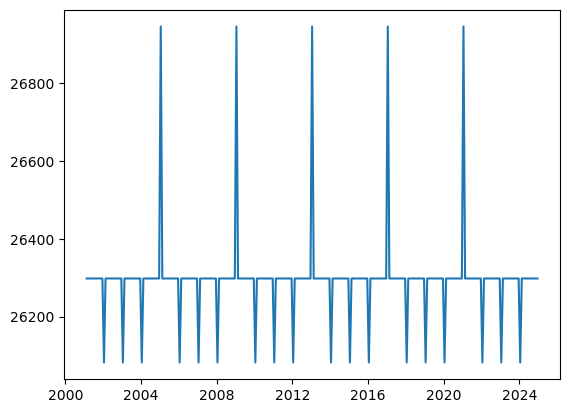

In [162]:
#check leap years are in the right place
plt.plot(Scaffold.time[1:],Scaffold.time.diff('time')/(1e11))

# VPD

In [66]:
test=xr.open_dataset(sorted(filelist_DEW)[0])
test

<xarray.Dataset> Size: 25MB
Dimensions:     (valid_time: 24, latitude: 360, longitude: 720)
Coordinates:
    number      int64 8B ...
  * valid_time  (valid_time) datetime64[ns] 192B 2001-01-01 ... 2001-01-01T23...
  * latitude    (latitude) float64 3kB 89.75 89.25 88.75 ... -89.25 -89.75
  * longitude   (longitude) float64 6kB -179.8 -179.2 -178.8 ... 179.2 179.8
    expver      (valid_time) <U4 384B ...
Data variables:
    d2m         (valid_time, latitude, longitude) float32 25MB ...
Attributes:
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2025-06-24T19:17 GRIB to CDM+CF via cfgrib-0.9.1...

In [65]:
def scifun_h2o_saturation_pressure(T): #Based on Github CARDAMOM-framework/CARDAMOM/MATLAB/sci_fun/SCIFUN_H2O_SATURATION_PRESSURE.m
    # %input = Temperature (degrees C)
    # %output = Water vapour saturation pressure(kPa)
    # %Method:
    # %NOAA website http://www.srh.noaa.gov/epz/?n=wxcalc_vaporpressure
    # %formulas in http://www.srh.noaa.gov/images/epz/wxcalc/vaporPressure.pdf
    
    # %
    # %Alternative
    # %ref:  PAPERS/manuals_userguides_etc/Humidity_Conversion_Formulas_B210973EN-F.pdf 
    # %OR %http://www.vaisala.com/Vaisala%20Documents/Application%20notes/Humidity_Conversion_Formulas_B210973EN-F.pdf
    
    
    # %in kPA (Temperature must be in C)
    # %The vapor pressure answers will be in units of millibars (mb) or hectoPascals (hPa)
    # %converting to kilopascals(divide by 10);
    VPSAT = 6.11 * (10**(7.5 * T / (237.3 + T))) / 10
    return VPSAT

2001 1
2002 1
2003 1
2004 1
2005 1
2006 1
2007 1
2008 1
2009 1
2010 1
2011 1


/var/folders/l2/3f6sq3tj411_rfqtzc14q89h0000gq/T/ipykernel_59528/2344571467.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(2,2))


2012 1
2013 1
2014 1
2015 1
2016 1
2017 1
2018 1
2019 1
2020 1
2021 1
2022 1
2023 1
2024 1
2001 2
2002 2
2003 2
2004 2
2005 2
2006 2
2007 2
2008 2
2009 2
2010 2
2011 2
2012 2
2013 2
2014 2
2015 2
2016 2
2017 2
2018 2
2019 2
2020 2
2021 2
2022 2
2023 2
2024 2
2001 3
2002 3
2003 3
2004 3
2005 3
2006 3
2007 3
2008 3
2009 3
2010 3
2011 3
2012 3
2013 3
2014 3
2015 3
2016 3
2017 3
2018 3
2019 3
2020 3
2021 3
2022 3
2023 3
2024 3
2001 4
2002 4
2003 4
2004 4
2005 4
2006 4
2007 4
2008 4
2009 4
2010 4
2011 4
2012 4
2013 4
2014 4
2015 4
2016 4
2017 4
2018 4
2019 4
2020 4
2021 4
2022 4
2023 4
2024 4
2001 5
2002 5
2003 5
2004 5
2005 5
2006 5
2007 5
2008 5
2009 5
2010 5
2011 5
2012 5
2013 5
2014 5
2015 5
2016 5
2017 5
2018 5
2019 5
2020 5
2021 5
2022 5
2023 5
2024 5
2001 6
2002 6
2003 6
2004 6
2005 6
2006 6
2007 6
2008 6
2009 6
2010 6
2011 6
2012 6
2013 6
2014 6
2015 6
2016 6
2017 6
2018 6
2019 6
2020 6
2021 6
2022 6
2023 6
2024 6
2001 7
2002 7
2003 7
2004 7
2005 7
2006 7
2007 7
2008 7
2009 7
2010 7

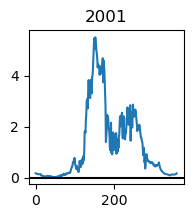

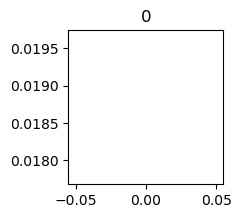

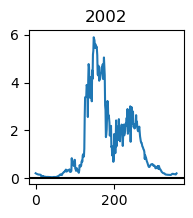

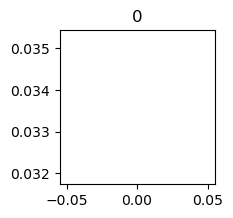

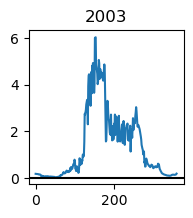

...

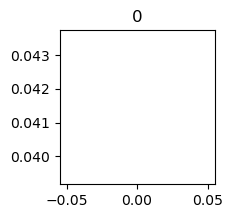

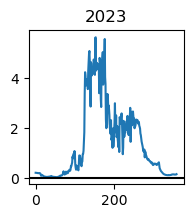

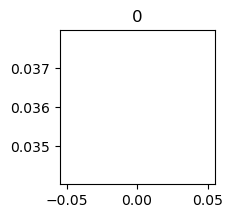

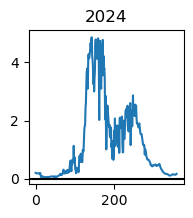

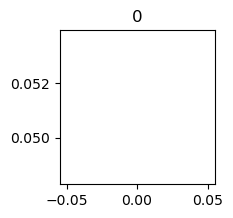

In [78]:
VPD=Scaffold.copy()

for i in np.arange(len(filelist_T2M)): 
    year=sorted(filelist_T2M)[i][-7:-3]
    month=int(sorted(filelist_T2M)[i][-9:-7])
    print(year,month)
    dates=VPD.time.isel(time=(VPD.time.dt.year.isin(int(year)) & VPD.time.dt.month.isin(int(month))))

    ### Calculate VPD based on the maximum airT and dewpointT from a monthly hourly climatology
        #airT maximum (convert to deg C)
    T2M_temp_raw=xr.open_dataset(sorted(filelist_T2M)[i])
    T2M_temp=T2M_temp_raw.t2m.transpose('valid_time','latitude','longitude').max('valid_time').data-273.15
        #DewpointT maximum (convert to deg C)
    D2M_temp_raw=xr.open_dataset(sorted(filelist_DEW)[i])
    D2M_temp=D2M_temp_raw.d2m.transpose('valid_time','latitude','longitude').max('valid_time').data-273.15
        #VPD calculation following Github CARDAMOM-framework/CARDAMOM-MAPS/MATLAB/metdriver_fun/CARDAMOM_MAPS_05deg_DATASETS_JUL24.m line 202
    VPD_temp_raw=((scifun_h2o_saturation_pressure(T2M_temp)-scifun_h2o_saturation_pressure(D2M_temp))*10).reshape(1, len(VPD.latitude),len(VPD.longitude)) 
    
    VPD_temp=xr.Dataset(data_vars=dict(VPD=(['time','latitude','longitude'], VPD_temp_raw)),
                      coords={'time':dates.data, 'longitude':T2M_temp_raw.longitude.data,'latitude':T2M_temp_raw.latitude.data})
    
    plt.figure(figsize=(2,2))
    plt.plot(VPD_temp.VPD.min('time').min('longitude')) #QC for latitudinal dist/negative vals 
    plt.axhline(y=0,color='k')
    plt.title(year)

    plt.figure(figsize=(2,2))
    plt.plot(VPD_temp.VPD.min('latitude').min('longitude')) #QC for negative values
    plt.title(int(VPD_temp.VPD.min().data))   
    VPD=xr.merge([VPD,VPD_temp])

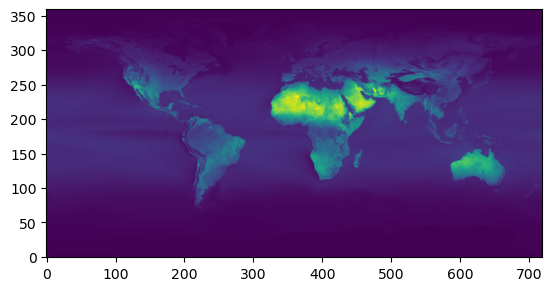

In [79]:
plt.imshow(VPD.VPD.mean('time'),origin='lower')

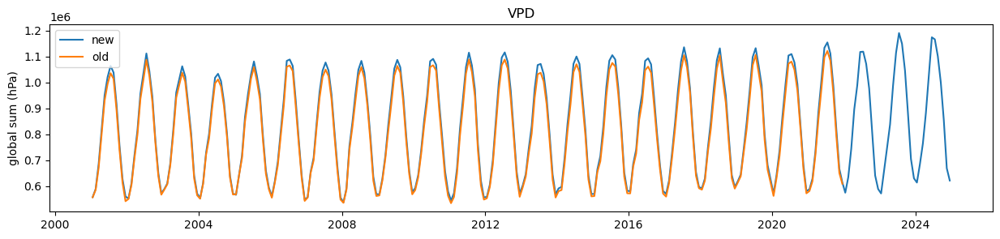

In [81]:
#old-new compare
plt.figure(figsize=(15,3))
VPDold=xr.load_dataset('/Users/bilir/Desktop/CardamomScratch/MET_DRIVERS_05x05/ERA5_VPD_2001-2021.nc')
plt.plot(VPD.time,VPD.VPD.where(LandFrac.data>0.5).sum('latitude').sum('longitude'),label='new')
plt.plot(VPDold.time,VPDold.VPD.where(LandFrac.data>0.5).sum('latitude').sum('longitude'),label='old')
plt.title('VPD')
plt.ylabel('global sum (hPa)')
plt.legend()

In [82]:
VPD=VPD.drop('empty')

/var/folders/l2/3f6sq3tj411_rfqtzc14q89h0000gq/T/ipykernel_59528/1451675318.py:1: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  VPD=VPD.drop('empty')


In [83]:
VPD2=VPD.copy()

# Replace problem values
VPD2['VPD'] = xr.where(VPD.VPD <0, 0, VPD.VPD)

In [87]:
#Mask to 50% land fraction
VPD3=VPD2.copy().where(LandFrac.data>0.5)
#VPD3.to_netcdf('/Users/bilir/Desktop/CardamomScratch/MET_DRIVERS_05x05/ERA5_VPD_2001-2024.nc')

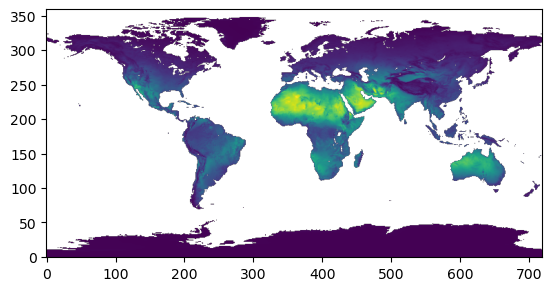

In [86]:
plt.imshow(VPD3.VPD.mean('time'),origin='lower')

# PREC

In [15]:
PREC=Scaffold.copy()

for i in np.arange(len(filelist_PREC)): 
    year=sorted(filelist_PREC)[i][-7:-3]
    month=int(sorted(filelist_PREC)[i][-9:-7])
    print(year,month)
    dates=PREC.time.isel(time=(PREC.time.dt.year.isin(int(year)) & PREC.time.dt.month.isin(int(month))))
    # print(np.array(dates.data))
    PREC_temp_raw=xr.open_dataset(sorted(filelist_PREC)[i])
    PREC_temp=xr.Dataset(data_vars=dict(PREC=(['time','latitude','longitude'], PREC_temp_raw['tp'].transpose('valid_time','latitude','longitude').data)),
                      coords={'time':np.array(dates.data), 'longitude':PREC_temp_raw.longitude.data,'latitude':PREC_temp_raw.latitude.data})
    PREC=xr.merge([PREC,PREC_temp])

2001 1
2002 1
2003 1
2004 1
2005 1
2006 1
2007 1
2008 1
2009 1
2010 1
2011 1
2012 1
2013 1
2014 1
2015 1
2016 1
2017 1
2018 1
2019 1
2020 1
2021 1
2022 1
2023 1
2024 1
2001 2
2002 2
2003 2
2004 2
2005 2
2006 2
2007 2
2008 2
2009 2
2010 2
2011 2
2012 2
2013 2
2014 2
2015 2
2016 2
2017 2
2018 2
2019 2
2020 2
2021 2
2022 2
2023 2
2024 2
2001 3
2002 3
2003 3
2004 3
2005 3
2006 3
2007 3
2008 3
2009 3
2010 3
2011 3
2012 3
2013 3
2014 3
2015 3
2016 3
2017 3
2018 3
2019 3
2020 3
2021 3
2022 3
2023 3
2024 3
2001 4
2002 4
2003 4
2004 4
2005 4
2006 4
2007 4
2008 4
2009 4
2010 4
2011 4
2012 4
2013 4
2014 4
2015 4
2016 4
2017 4
2018 4
2019 4
2020 4
2021 4
2022 4
2023 4
2024 4
2001 5
2002 5
2003 5
2004 5
2005 5
2006 5
2007 5
2008 5
2009 5
2010 5
2011 5
2012 5
2013 5
2014 5
2015 5
2016 5
2017 5
2018 5
2019 5
2020 5
2021 5
2022 5
2023 5
2024 5
2001 6
2002 6
2003 6
2004 6
2005 6
2006 6
2007 6
2008 6
2009 6
2010 6
2011 6
2012 6
2013 6
2014 6
2015 6
2016 6
2017 6
2018 6
2019 6
2020 6
2021 6
2022 6
2023 6

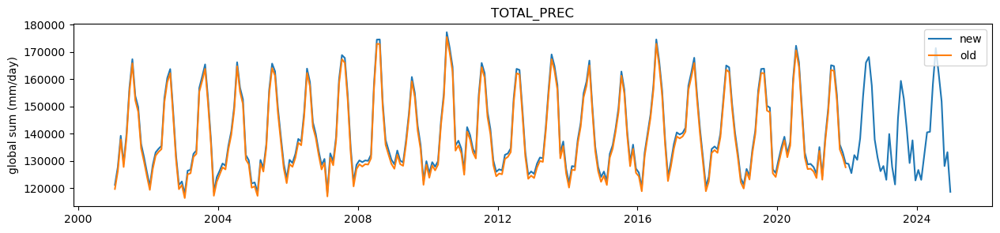

In [16]:
#evaluate with old file
plt.figure(figsize=(15,3))
old_prec=xr.load_dataset('/Users/bilir/Desktop/CardamomScratch/MET_DRIVERS_05x05/TOTAL_PREC_2001-2021.nc')
plt.plot(PREC.time,PREC.PREC.where(LandFrac.data>0.5).sum('latitude').sum('longitude')*1000,label='new')
plt.plot(old_prec.time,old_prec.PREC.where(LandFrac.data>0.5).sum('latitude').sum('longitude'),label='old')
plt.title('TOTAL_PREC')
plt.ylabel('global sum (mm/day)')
plt.legend()

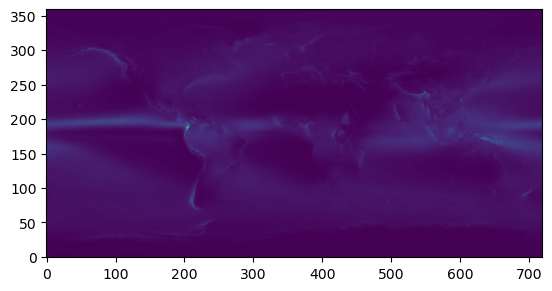

In [17]:
plt.imshow(PREC.PREC.mean('time'),origin='lower')

In [19]:
#check for unphysical values
np.where(PREC.PREC<0)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))

In [46]:
PREC=PREC.drop('empty')
PREC2=PREC.where(LandFrac.data>0.5)*1000 #mask land, update units
#PREC2.to_netcdf('/Users/bilir/Desktop/CardamomScratch/MET_DRIVERS_05x05/ERA5_TOTAL_PREC_2001-2024.nc') #save file

/var/folders/l2/3f6sq3tj411_rfqtzc14q89h0000gq/T/ipykernel_76344/385359179.py:1: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  PREC=PREC.drop('empty')


# TMIN

In [12]:
TMIN=Scaffold.copy()

for i in np.arange(len(filelist_T2M)): 
    year=sorted(filelist_T2M)[i][-7:-3]
    month=int(sorted(filelist_T2M)[i][-9:-7])
    print(year,month)
    dates=TMIN.time.isel(time=(TMIN.time.dt.year.isin(int(year)) & TMIN.time.dt.month.isin(int(month))))
     #airT minimum (convert to deg C)
    T2M_temp_raw=xr.open_dataset(sorted(filelist_T2M)[i])
    T2M_temp=(T2M_temp_raw.t2m.transpose('valid_time','latitude','longitude').min('valid_time').data-273.15).reshape(1, len(T2M_temp_raw.latitude),len(T2M_temp_raw.longitude)) 
    
    TMIN_temp=xr.Dataset(data_vars=dict(TMIN=(['time','latitude','longitude'], T2M_temp)),
                      coords={'time':dates.data, 'longitude':T2M_temp_raw.longitude.data,'latitude':T2M_temp_raw.latitude.data})
    TMIN=xr.merge([TMIN,TMIN_temp])

2001 1
2002 1
2003 1
2004 1
2005 1
2006 1
2007 1
2008 1
2009 1
2010 1
2011 1
2012 1
2013 1
2014 1
2015 1
2016 1
2017 1
2018 1
2019 1
2020 1
2021 1
2022 1
2023 1
2024 1
2001 2
2002 2
2003 2
2004 2
2005 2
2006 2
2007 2
2008 2
2009 2
2010 2
2011 2
2012 2
2013 2
2014 2
2015 2
2016 2
2017 2
2018 2
2019 2
2020 2
2021 2
2022 2
2023 2
2024 2
2001 3
2002 3
2003 3
2004 3
2005 3
2006 3
2007 3
2008 3
2009 3
2010 3
2011 3
2012 3
2013 3
2014 3
2015 3
2016 3
2017 3
2018 3
2019 3
2020 3
2021 3
2022 3
2023 3
2024 3
2001 4
2002 4
2003 4
2004 4
2005 4
2006 4
2007 4
2008 4
2009 4
2010 4
2011 4
2012 4
2013 4
2014 4
2015 4
2016 4
2017 4
2018 4
2019 4
2020 4
2021 4
2022 4
2023 4
2024 4
2001 5
2002 5
2003 5
2004 5
2005 5
2006 5
2007 5
2008 5
2009 5
2010 5
2011 5
2012 5
2013 5
2014 5
2015 5
2016 5
2017 5
2018 5
2019 5
2020 5
2021 5
2022 5
2023 5
2024 5
2001 6
2002 6
2003 6
2004 6
2005 6
2006 6
2007 6
2008 6
2009 6
2010 6
2011 6
2012 6
2013 6
2014 6
2015 6
2016 6
2017 6
2018 6
2019 6
2020 6
2021 6
2022 6
2023 6

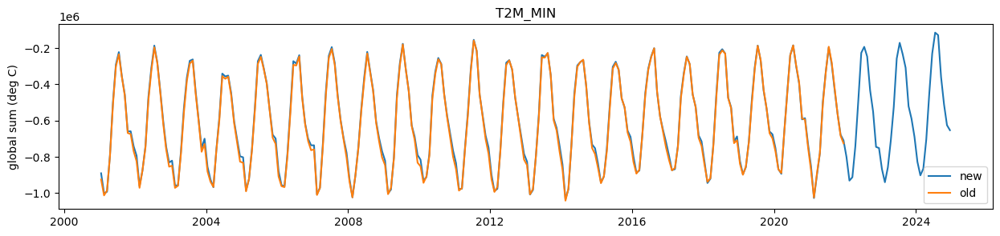

In [15]:
#old-new compare
plt.figure(figsize=(15,3))
old_T2MMin=xr.load_dataset('/Users/bilir/Desktop/CardamomScratch/MET_DRIVERS_05x05/ERA5_T2MMIN_2001-2021.nc')
plt.plot(TMIN.time,TMIN.TMIN.where(LandFrac.data>0.5).sum('latitude').sum('longitude'),label='new')
plt.plot(old_T2MMin.time,old_T2MMin.TMIN.where(LandFrac.data>0.5).sum('latitude').sum('longitude'),label='old')
plt.title('T2M_MIN')
plt.ylabel('global sum (deg C)')
plt.legend()

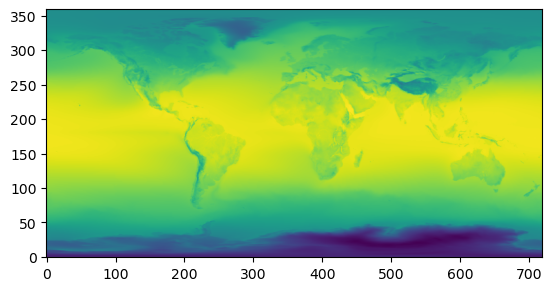

In [16]:
plt.imshow(TMIN.TMIN.mean('time'),origin='lower')

In [17]:
TMIN=TMIN.drop('empty')

/var/folders/l2/3f6sq3tj411_rfqtzc14q89h0000gq/T/ipykernel_76344/1570069859.py:1: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  TMIN=TMIN.drop('empty')


In [19]:
#Mask to 50% land fraction
TMIN2=TMIN.copy().where(LandFrac.data>0.5)
#TMIN2.to_netcdf('/Users/bilir/Desktop/Cardamomscratch/MET_DRIVERS_05x05/ERA5_T2MMIN_2001-2024.nc')

# TMAX

In [22]:
TMAX=Scaffold.copy()

for i in np.arange(len(filelist_T2M)): 
    year=sorted(filelist_T2M)[i][-7:-3]
    month=int(sorted(filelist_T2M)[i][-9:-7])
    print(year,month)
    dates=TMAX.time.isel(time=(TMAX.time.dt.year.isin(int(year)) & TMAX.time.dt.month.isin(int(month))))
     #airT minimum (convert to deg C)
    T2M_temp_raw=xr.open_dataset(sorted(filelist_T2M)[i])
    T2M_temp=(T2M_temp_raw.t2m.transpose('valid_time','latitude','longitude').max('valid_time').data-273.15).reshape(1, len(T2M_temp_raw.latitude),len(T2M_temp_raw.longitude)) 
    
    TMAX_temp=xr.Dataset(data_vars=dict(TMAX=(['time','latitude','longitude'], T2M_temp)),
                      coords={'time':dates.data, 'longitude':T2M_temp_raw.longitude.data,'latitude':T2M_temp_raw.latitude.data})
    TMAX=xr.merge([TMAX,TMAX_temp])

2001 1
2002 1
2003 1
2004 1
2005 1
2006 1
2007 1
2008 1
2009 1
2010 1
2011 1
2012 1
2013 1
2014 1
2015 1
2016 1
2017 1
2018 1
2019 1
2020 1
2021 1
2022 1
2023 1
2024 1
2001 2
2002 2
2003 2
2004 2
2005 2
2006 2
2007 2
2008 2
2009 2
2010 2
2011 2
2012 2
2013 2
2014 2
2015 2
2016 2
2017 2
2018 2
2019 2
2020 2
2021 2
2022 2
2023 2
2024 2
2001 3
2002 3
2003 3
2004 3
2005 3
2006 3
2007 3
2008 3
2009 3
2010 3
2011 3
2012 3
2013 3
2014 3
2015 3
2016 3
2017 3
2018 3
2019 3
2020 3
2021 3
2022 3
2023 3
2024 3
2001 4
2002 4
2003 4
2004 4
2005 4
2006 4
2007 4
2008 4
2009 4
2010 4
2011 4
2012 4
2013 4
2014 4
2015 4
2016 4
2017 4
2018 4
2019 4
2020 4
2021 4
2022 4
2023 4
2024 4
2001 5
2002 5
2003 5
2004 5
2005 5
2006 5
2007 5
2008 5
2009 5
2010 5
2011 5
2012 5
2013 5
2014 5
2015 5
2016 5
2017 5
2018 5
2019 5
2020 5
2021 5
2022 5
2023 5
2024 5
2001 6
2002 6
2003 6
2004 6
2005 6
2006 6
2007 6
2008 6
2009 6
2010 6
2011 6
2012 6
2013 6
2014 6
2015 6
2016 6
2017 6
2018 6
2019 6
2020 6
2021 6
2022 6
2023 6

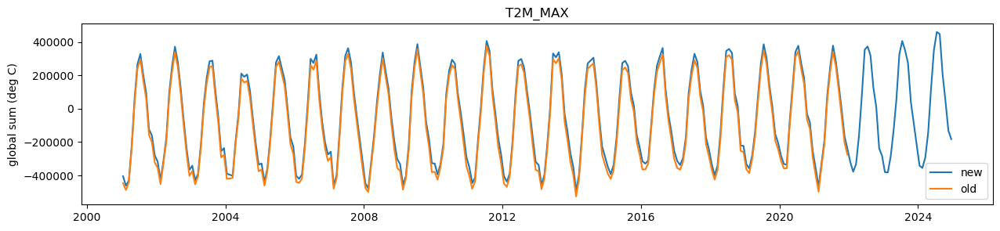

In [23]:
#old-new compare
plt.figure(figsize=(15,3))
old_T2MMax=xr.load_dataset('/Users/bilir/Desktop/CardamomScratch/MET_DRIVERS_05x05/ERA5_T2MMAX_2001-2021.nc')
plt.plot(TMAX.time,TMAX.TMAX.where(LandFrac.data>0.5).sum('latitude').sum('longitude'),label='new')
plt.plot(old_T2MMax.time,old_T2MMax.TMAX.where(LandFrac.data>0.5).sum('latitude').sum('longitude'),label='old')
plt.title('T2M_MAX')
plt.ylabel('global sum (deg C)')
plt.legend()

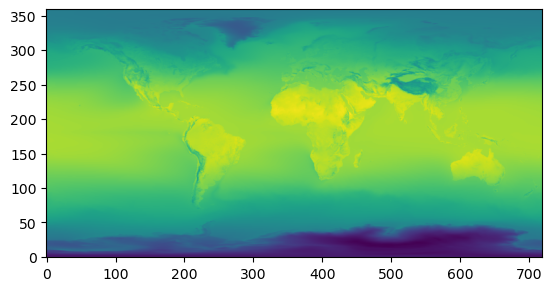

In [24]:
plt.imshow(TMAX.TMAX.mean('time'),origin='lower')

In [27]:

#TMAX=TMAX.drop('empty')

In [28]:
#Mask to 50% land fraction
TMAX2=TMAX.copy().where(LandFrac.data>0.5)
#TMAX2.to_netcdf('/Users/bilir/Desktop/CardamomScratch/MET_DRIVERS_05x05/ERA5_T2MMAX_2001-2024.nc')

# STRD

In [78]:
#No new data downloaded from ERA5; ran into an error. Since this variable is unrelated to to all carbon and water cycling, it is extended with a climatology.
# STRD_temp=xr.load_dataset('/Users/bilir/Desktop/CardamomScratch/MET_DRIVERS_05x05/ERA5_STRD_2001-2021.nc')
# STRD_temp
# plt.plot(STRD_temp.STRD.groupby(STRD_temp.time.dt.month).mean().sum('latitude').sum('longitude'))
Clim=STRD_temp.STRD.groupby(STRD_temp.time.dt.month).mean()
Clim.isel(month=(Clim.month.isin(1)))

<xarray.DataArray 'STRD' (month: 1, latitude: 360, longitude: 720)> Size: 2MB
array([[[11.06843834, 11.06977105, 11.07114573, ..., 11.06276599,
         11.06481927, 11.06676815],
        [11.01737648, 11.02345989, 11.02969041, ..., 11.00028013,
         11.00579582, 11.0114596 ],
        [10.9247026 , 10.93340047, 10.94226838, ..., 10.89905325,
         10.90754144, 10.91596214],
        ...,
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan]]], shape=(1, 360, 720))
Coordinates:
  * longitude  (longitude) float64 6kB -179.8 -179.2 -178.8 ... 179.2 179.8
  * latitude   (latitude) float64 3kB -89.75 -89.25 -88.75 ... 88.75 89.25 89.75
  * month      (month) int64 8B 1

In [86]:
STRD=Scaffold.copy()
STRD_temp=xr.load_dataset('/Users/bilir/Desktop/CardamomScratch/MET_DRIVERS_05x05/ERA5_STRD_2001-2021.nc')
Clim=STRD_temp.STRD.groupby(STRD_temp.time.dt.month).mean()

for i in np.arange(len(filelist_SSRD)): #loop over these just for the dates
    year=sorted(filelist_SSRD)[i][-7:-3]
    month=int(sorted(filelist_SSRD)[i][-9:-7])
    print(year,month)
    dates=STRD.time.isel(time=(STRD.time.dt.year.isin(int(year)) & STRD.time.dt.month.isin(int(month))))
    STRD_temp_init=STRD_temp.STRD.isel(time=(STRD_temp.time.isin(dates)))

    if STRD_temp_init.size > 0:
        # print(f"Already have data for {year}-{month}. Taking the data.")
        STRD_temp_final=STRD_temp_init.transpose('time','latitude','longitude').data
        print(np.nanmax(STRD_temp_final),np.nanmin(STRD_temp_final))
    else:
        print(f"No data for {year}-{month}. Using climatology.")
        STRD_temp_final=Clim.isel(month=(Clim.month.isin(month))).transpose('month','latitude','longitude').data
        print(np.nanmax(STRD_temp_final),np.nanmin(STRD_temp_final))
    
    STRD_temp2=xr.Dataset(data_vars=dict(STRD=(['time','latitude','longitude'], STRD_temp_final)),
                      coords={'time':dates.data, 'longitude':STRD.longitude.data,'latitude':STRD.latitude.data})
    STRD=xr.merge([STRD,STRD_temp2])

2001 1
37.951823 8.756885
2002 1
38.290735 9.442753
2003 1
37.803815 8.676177000000001
2004 1
37.427710999999995 9.176713
2005 1
37.879352 8.872755999999999
2006 1
37.750555999999996 8.733568
2007 1
37.923128999999996 8.729913
2008 1
38.50008 8.048916000000002
2009 1
37.654762999999996 9.177251
2010 1
37.893094999999995 9.195340999999997
2011 1
38.281461 9.031949
2012 1
38.302226999999995 8.397559
2013 1
38.302803999999995 8.88762
2014 1
37.665791999999996 9.12892
2015 1
37.404426742709774 9.11656
2016 1
38.296485 8.331059
2017 1
38.159780999999995 9.103110999999998
2018 1
37.892776999999995 9.144290999999999
2019 1
38.62034 8.688278
2020 1
38.389846999999996 9.299783000000001
2021 1
37.783061 8.487150999999999
2022 1
No data for 2022-1. Using climatology.
37.84214628332944 9.235906686499643
2023 1
No data for 2023-1. Using climatology.
37.84214628332944 9.235906686499643
2024 1
No data for 2024-1. Using climatology.
37.84214628332944 9.235906686499643
2001 2
37.598061 8.077983
2002 2


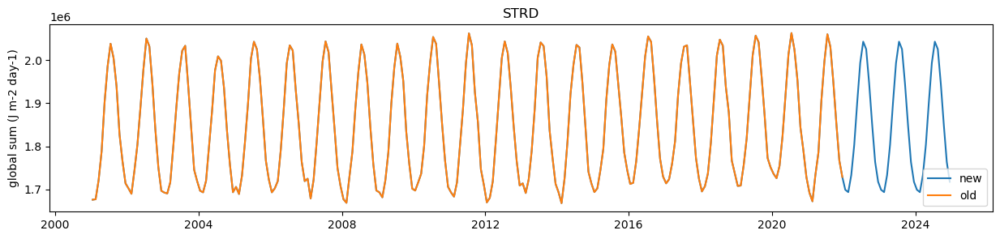

In [89]:
#old-new compare
plt.figure(figsize=(15,3))
plt.plot(STRD.time,STRD.STRD.where(LandFrac.data>0.5).sum('latitude').sum('longitude'),label='new')
plt.plot(STRD_temp.time,STRD_temp.STRD.where(LandFrac.data>0.5).sum('latitude').sum('longitude'),label='old')
plt.title('STRD')
plt.ylabel('global sum (J m-2 day-1)')
plt.legend()

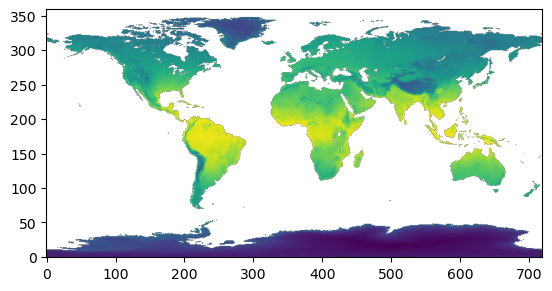

In [90]:
plt.imshow(STRD.STRD.mean('time'),origin='lower')

In [91]:

STRD=STRD.drop('empty')

/var/folders/l2/3f6sq3tj411_rfqtzc14q89h0000gq/T/ipykernel_58725/977145152.py:1: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  STRD=STRD.drop('empty')


In [92]:
#check for positive-definite
np.where(STRD.STRD<0)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))

In [93]:
#Mask to 50% land fraction
STRD2=STRD.copy().where(LandFrac.data>0.5)
#STRD2.to_netcdf('/Users/bilir/Desktop/CardamomScratch/MET_DRIVERS_05x05/ERA5_STRD_2001-2021withClimatologyExtensionto2024.nc')

# SSRD

In [163]:
test=xr.open_dataset(sorted(filelist_SSRD)[0])
test
 # int(sorted(filelist_PREC)[0][-9:-7])

<xarray.Dataset> Size: 1MB
Dimensions:     (valid_time: 1, latitude: 360, longitude: 720)
Coordinates:
    number      int64 8B ...
  * valid_time  (valid_time) datetime64[ns] 8B 2001-01-01T06:00:00
  * latitude    (latitude) float64 3kB 89.75 89.25 88.75 ... -89.25 -89.75
  * longitude   (longitude) float64 6kB -179.8 -179.2 -178.8 ... 179.2 179.8
    expver      <U4 16B ...
Data variables:
    ssrd        (valid_time, latitude, longitude) float32 1MB ...
Attributes:
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2025-06-24T19:24 GRIB to CDM+CF via cfgrib-0.9.1...

In [164]:
SSRD=Scaffold.copy()

for i in np.arange(len(filelist_SSRD)): 
    year=sorted(filelist_SSRD)[i][-7:-3]
    month=int(sorted(filelist_SSRD)[i][-9:-7])
    print(year,month)
    dates=SSRD.time.isel(time=(SSRD.time.dt.year.isin(int(year)) & SSRD.time.dt.month.isin(int(month))))
    SSRD_temp_raw=xr.open_dataset(sorted(filelist_SSRD)[i])
    SSRD_temp=xr.Dataset(data_vars=dict(SSRD=(['time','latitude','longitude'], SSRD_temp_raw['ssrd'].transpose('valid_time','latitude','longitude').data)),
                      coords={'time':dates.data, 'longitude':SSRD_temp_raw.longitude.data,'latitude':SSRD_temp_raw.latitude.data})
    SSRD=xr.merge([SSRD,SSRD_temp])

2001 1
2002 1
2003 1
2004 1
2005 1
2006 1
2007 1
2008 1
2009 1
2010 1
2011 1
2012 1
2013 1
2014 1
2015 1
2016 1
2017 1
2018 1
2019 1
2020 1
2021 1
2022 1
2023 1
2024 1
2001 2
2002 2
2003 2
2004 2
2005 2
2006 2
2007 2
2008 2
2009 2
2010 2
2011 2
2012 2
2013 2
2014 2
2015 2
2016 2
2017 2
2018 2
2019 2
2020 2
2021 2
2022 2
2023 2
2024 2
2001 3
2002 3
2003 3
2004 3
2005 3
2006 3
2007 3
2008 3
2009 3
2010 3
2011 3
2012 3
2013 3
2014 3
2015 3
2016 3
2017 3
2018 3
2019 3
2020 3
2021 3
2022 3
2023 3
2024 3
2001 4
2002 4
2003 4
2004 4
2005 4
2006 4
2007 4
2008 4
2009 4
2010 4
2011 4
2012 4
2013 4
2014 4
2015 4
2016 4
2017 4
2018 4
2019 4
2020 4
2021 4
2022 4
2023 4
2024 4
2001 5
2002 5
2003 5
2004 5
2005 5
2006 5
2007 5
2008 5
2009 5
2010 5
2011 5
2012 5
2013 5
2014 5
2015 5
2016 5
2017 5
2018 5
2019 5
2020 5
2021 5
2022 5
2023 5
2024 5
2001 6
2002 6
2003 6
2004 6
2005 6
2006 6
2007 6
2008 6
2009 6
2010 6
2011 6
2012 6
2013 6
2014 6
2015 6
2016 6
2017 6
2018 6
2019 6
2020 6
2021 6
2022 6
2023 6

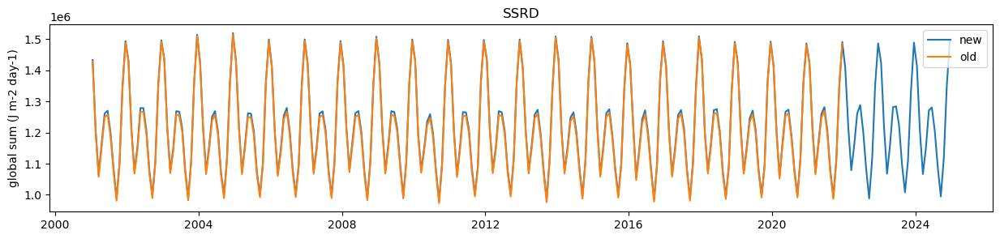

In [165]:
# old-new compare
plt.figure(figsize=(15,3))
old_ssrd=xr.load_dataset('/Users/bilir/Desktop/CardamomScratch/MET_DRIVERS_05x05/ERA5_SSRD_2001-2021.nc')
plt.plot(SSRD.time,SSRD.SSRD.where(LandFrac.data>0.5).sum('latitude').sum('longitude')/1e6,label='new')
plt.plot(old_ssrd.time,old_ssrd.SSRD.where(LandFrac.data>0.5).sum('latitude').sum('longitude'),label='old')
plt.title('SSRD')
plt.ylabel('global sum (J m-2 day-1)')
plt.legend()

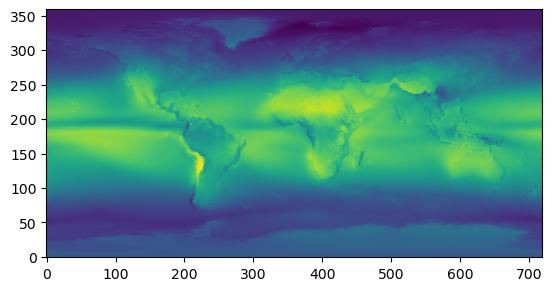

In [166]:
plt.imshow(SSRD.SSRD.mean('time'),origin='lower')

In [167]:

SSRD=SSRD.drop('empty')

/var/folders/l2/3f6sq3tj411_rfqtzc14q89h0000gq/T/ipykernel_58725/4110548024.py:1: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  SSRD=SSRD.drop('empty')


In [168]:
len(np.where((SSRD.SSRD.where(LandFrac.data>0.5))<0)[0]) #unphysical value

33425

In [172]:
SSRD2=SSRD.copy()

# Replace values
SSRD2['SSRD'] = xr.where(SSRD.SSRD <0, 0, SSRD.SSRD)/1e6
#SSRD2.to_netcdf('/Users/bilir/Desktop/CardamomScratch/MET_DRIVERS_05x05/ERA5_SSRD_2001-2024.nc')

In [173]:
#Mask to 50% land fraction
SSRD3=SSRD2.copy().where(LandFrac.data>0.5)
# plt.imshow(SSRD3.SSRD.mean('time'))
SSRD3.to_netcdf('/Users/bilir/Desktop/CardamomScratch/MET_DRIVERS_05x05/ERA5_SSRD_2001-2024.nc')

# SNOW

In [11]:
SNOW_temp_raw=xr.open_dataset(sorted(filelist_SNOW)[0])
SNOW_temp_raw

<xarray.Dataset> Size: 1MB
Dimensions:     (valid_time: 1, latitude: 360, longitude: 720)
Coordinates:
    number      int64 8B ...
  * valid_time  (valid_time) datetime64[ns] 8B 2001-01-01T06:00:00
  * latitude    (latitude) float64 3kB 89.75 89.25 88.75 ... -89.25 -89.75
  * longitude   (longitude) float64 6kB -179.8 -179.2 -178.8 ... 179.2 179.8
    expver      <U4 16B ...
Data variables:
    sf          (valid_time, latitude, longitude) float32 1MB ...
Attributes:
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2025-06-24T19:24 GRIB to CDM+CF via cfgrib-0.9.1...

In [13]:
SNOW=Scaffold.copy()

for i in np.arange(len(filelist_SNOW)): 
    year=sorted(filelist_SNOW)[i][-7:-3]
    month=int(sorted(filelist_SNOW)[i][-9:-7])
    print(year,month)
    dates=SNOW.time.isel(time=(SNOW.time.dt.year.isin(int(year)) & SNOW.time.dt.month.isin(int(month))))
    SNOW_temp_raw=xr.open_dataset(sorted(filelist_SNOW)[i])
    SNOW_temp=xr.Dataset(data_vars=dict(SNOW=(['time','latitude','longitude'], SNOW_temp_raw['sf'].transpose('valid_time','latitude','longitude').data)),
                      coords={'time':dates.data, 'longitude':SNOW_temp_raw.longitude.data,'latitude':SNOW_temp_raw.latitude.data})
    SNOW=xr.merge([SNOW,SNOW_temp])

2001 1
2002 1
2003 1
2004 1
2005 1
2006 1
2007 1
2008 1
2009 1
2010 1
2011 1
2012 1
2013 1
2014 1
2015 1
2016 1
2017 1
2018 1
2019 1
2020 1
2021 1
2022 1
2023 1
2024 1
2001 2
2002 2
2003 2
2004 2
2005 2
2006 2
2007 2
2008 2
2009 2
2010 2
2011 2
2012 2
2013 2
2014 2
2015 2
2016 2
2017 2
2018 2
2019 2
2020 2
2021 2
2022 2
2023 2
2024 2
2001 3
2002 3
2003 3
2004 3
2005 3
2006 3
2007 3
2008 3
2009 3
2010 3
2011 3
2012 3
2013 3
2014 3
2015 3
2016 3
2017 3
2018 3
2019 3
2020 3
2021 3
2022 3
2023 3
2024 3
2001 4
2002 4
2003 4
2004 4
2005 4
2006 4
2007 4
2008 4
2009 4
2010 4
2011 4
2012 4
2013 4
2014 4
2015 4
2016 4
2017 4
2018 4
2019 4
2020 4
2021 4
2022 4
2023 4
2024 4
2001 5
2002 5
2003 5
2004 5
2005 5
2006 5
2007 5
2008 5
2009 5
2010 5
2011 5
2012 5
2013 5
2014 5
2015 5
2016 5
2017 5
2018 5
2019 5
2020 5
2021 5
2022 5
2023 5
2024 5
2001 6
2002 6
2003 6
2004 6
2005 6
2006 6
2007 6
2008 6
2009 6
2010 6
2011 6
2012 6
2013 6
2014 6
2015 6
2016 6
2017 6
2018 6
2019 6
2020 6
2021 6
2022 6
2023 6

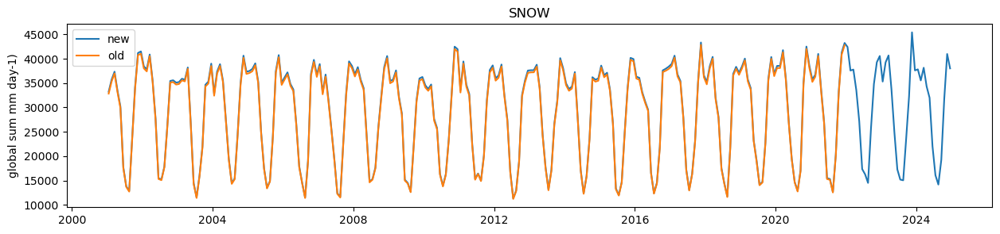

In [47]:
# old-new compare
plt.figure(figsize=(15,3))
old_SNOW=xr.load_dataset('/Users/bilir/Desktop/CardamomScratch/MET_DRIVERS_05x05/ERA5_SNOW_2001-2021.nc')
plt.plot(SNOW.time,SNOW.SNOW.where(LandFrac.data>0.5).sum('latitude').sum('longitude')*1000,label='new')
plt.plot(old_SNOW.time,old_SNOW.SNOW.where(LandFrac.data>0.5).sum('latitude').sum('longitude'),label='old')
plt.title('SNOW')
plt.ylabel('global sum mm day-1)')
plt.legend()

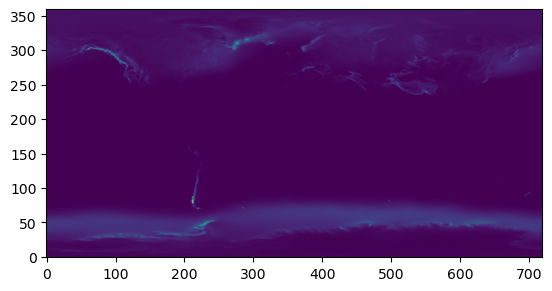

In [18]:
plt.imshow(SNOW.SNOW.mean('time'),origin='lower')

In [51]:
SNOW=SNOW.drop('empty')
SNOW2=SNOW.where(LandFrac.data>0.5)*1000
#SNOW2.to_netcdf('/Users/bilir/Desktop/CardamomScratch/MET_DRIVERS_05x05/ERA5_SNOW_2001-2024.nc')

/var/folders/l2/3f6sq3tj411_rfqtzc14q89h0000gq/T/ipykernel_76344/4017144976.py:1: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  SNOW=SNOW.drop('empty')


# SKT

In [11]:
SKT_temp_raw=xr.open_dataset(sorted(filelist_SKT)[0])
SKT_temp_raw

<xarray.Dataset> Size: 1MB
Dimensions:     (valid_time: 1, latitude: 360, longitude: 720)
Coordinates:
    number      int64 8B ...
  * valid_time  (valid_time) datetime64[ns] 8B 2001-01-01
  * latitude    (latitude) float64 3kB 89.75 89.25 88.75 ... -89.25 -89.75
  * longitude   (longitude) float64 6kB -179.8 -179.2 -178.8 ... 179.2 179.8
    expver      <U4 16B ...
Data variables:
    skt         (valid_time, latitude, longitude) float32 1MB ...
Attributes:
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2025-06-24T19:24 GRIB to CDM+CF via cfgrib-0.9.1...

In [12]:
SKT=Scaffold.copy()

for i in np.arange(len(filelist_SKT)): 
    year=sorted(filelist_SKT)[i][-7:-3]
    month=int(sorted(filelist_SKT)[i][-9:-7])
    print(year,month)
    dates=SKT.time.isel(time=(SKT.time.dt.year.isin(int(year)) & SKT.time.dt.month.isin(int(month))))
    SKT_temp_raw=xr.open_dataset(sorted(filelist_SKT)[i])
    SKT_temp=xr.Dataset(data_vars=dict(SKT=(['time','latitude','longitude'], SKT_temp_raw['skt'].transpose('valid_time','latitude','longitude').data-273.15)),
                      coords={'time':dates.data, 'longitude':SKT_temp_raw.longitude.data,'latitude':SKT_temp_raw.latitude.data})
    SKT=xr.merge([SKT,SKT_temp])

2001 1
2002 1
2003 1
2004 1
2005 1
2006 1
2007 1
2008 1
2009 1
2010 1
2011 1
2012 1
2013 1
2014 1
2015 1
2016 1
2017 1
2018 1
2019 1
2020 1
2021 1
2022 1
2023 1
2024 1
2001 2
2002 2
2003 2
2004 2
2005 2
2006 2
2007 2
2008 2
2009 2
2010 2
2011 2
2012 2
2013 2
2014 2
2015 2
2016 2
2017 2
2018 2
2019 2
2020 2
2021 2
2022 2
2023 2
2024 2
2001 3
2002 3
2003 3
2004 3
2005 3
2006 3
2007 3
2008 3
2009 3
2010 3
2011 3
2012 3
2013 3
2014 3
2015 3
2016 3
2017 3
2018 3
2019 3
2020 3
2021 3
2022 3
2023 3
2024 3
2001 4
2002 4
2003 4
2004 4
2005 4
2006 4
2007 4
2008 4
2009 4
2010 4
2011 4
2012 4
2013 4
2014 4
2015 4
2016 4
2017 4
2018 4
2019 4
2020 4
2021 4
2022 4
2023 4
2024 4
2001 5
2002 5
2003 5
2004 5
2005 5
2006 5
2007 5
2008 5
2009 5
2010 5
2011 5
2012 5
2013 5
2014 5
2015 5
2016 5
2017 5
2018 5
2019 5
2020 5
2021 5
2022 5
2023 5
2024 5
2001 6
2002 6
2003 6
2004 6
2005 6
2006 6
2007 6
2008 6
2009 6
2010 6
2011 6
2012 6
2013 6
2014 6
2015 6
2016 6
2017 6
2018 6
2019 6
2020 6
2021 6
2022 6
2023 6

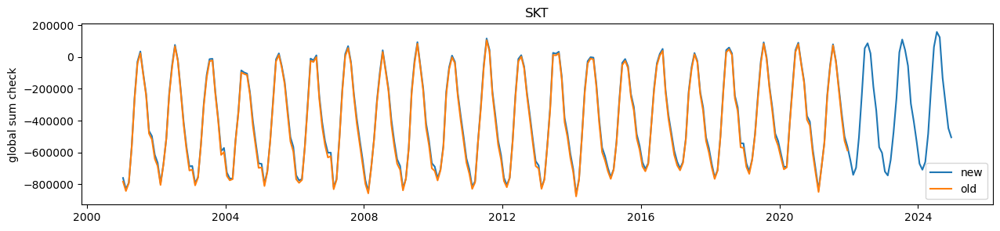

In [94]:
# old-new compare
plt.figure(figsize=(15,3))
old_SKT=xr.load_dataset('/Users/bilir/Desktop/CardamomScratch/MET_DRIVERS_05x05/ERA5_SKT_2001-2021.nc')
plt.plot(SKT.time,SKT.SKT.where(LandFrac.data>0.5).sum('latitude').sum('longitude'),label='new')
plt.plot(old_SKT.time,old_SKT.SKT.where(LandFrac.data>0.5).sum('latitude').sum('longitude'),label='old')
plt.title('SKT')
plt.ylabel('global sum check')
plt.legend()

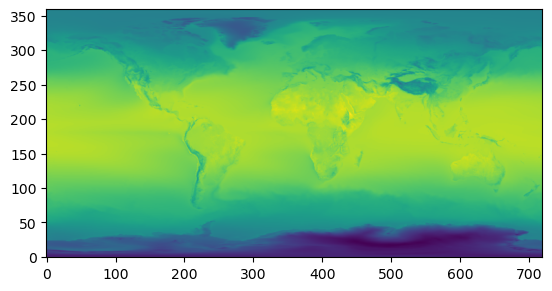

In [14]:
plt.imshow(SKT.SKT.mean('time'),origin='lower')

In [15]:
SKT=SKT.drop('empty')

/var/folders/l2/3f6sq3tj411_rfqtzc14q89h0000gq/T/ipykernel_58725/1645759864.py:1: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  SKT=SKT.drop('empty')


In [16]:
#Mask to 50% land fraction
SKT2=SKT.copy().where(LandFrac.data>0.5)
#SKT2.to_netcdf('/Users/bilir/Desktop/CardamomScratch/MET_DRIVERS_05x05/ERA5_SKT_2001-2024.nc')

# CO2

#### Read in data (warning, long cell)

In [45]:
#from https://gml.noaa.gov/webdata/ccgg/trends/co2/co2_mm_gl.txt
from io import StringIO
data = """1979       1      1979.042        336.56          0.11        335.92          0.10
  1979       2      1979.125        337.29          0.09        336.25          0.10
  1979       3      1979.208        337.88          0.11        336.51          0.10
  1979       4      1979.292        338.32          0.13        336.72          0.11
  1979       5      1979.375        338.26          0.04        336.71          0.11
  1979       6      1979.458        337.38          0.18        336.61          0.11
  1979       7      1979.542        335.56          0.27        336.41          0.12
  1979       8      1979.625        334.36          0.30        336.65          0.12
  1979       9      1979.708        335.02          0.24        337.40          0.12
  1979      10      1979.792        336.36          0.25        337.71          0.12
  1979      11      1979.875        337.36          0.20        337.68          0.11
  1979      12      1979.958        337.89          0.15        337.66          0.11
  1980       1      1980.042        338.58          0.13        337.94          0.10
  1980       2      1980.125        339.26          0.09        338.23          0.10
  1980       3      1980.208        339.59          0.08        338.23          0.09
  1980       4      1980.292        339.99          0.08        338.39          0.08
  1980       5      1980.375        340.44          0.09        338.89          0.08
  1980       6      1980.458        339.99          0.09        339.22          0.07
  1980       7      1980.542        338.44          0.16        339.28          0.07
  1980       8      1980.625        337.21          0.18        339.50          0.06
  1980       9      1980.708        337.05          0.12        339.44          0.06
  1980      10      1980.792        337.82          0.08        339.17          0.07
  1980      11      1980.875        338.93          0.07        339.26          0.07
  1980      12      1980.958        339.64          0.08        339.40          0.07
  1981       1      1981.042        340.19          0.10        339.55          0.08
  1981       2      1981.125        340.75          0.11        339.71          0.08
  1981       3      1981.208        341.38          0.12        340.01          0.08
  1981       4      1981.292        341.68          0.09        340.08          0.09
  1981       5      1981.375        341.43          0.07        339.88          0.09
  1981       6      1981.458        340.63          0.11        339.86          0.09
  1981       7      1981.542        339.22          0.14        340.07          0.09
  1981       8      1981.625        338.08          0.16        340.37          0.09
  1981       9      1981.708        337.97          0.12        340.36          0.09
  1981      10      1981.792        339.07          0.10        340.42          0.08
  1981      11      1981.875        340.18          0.12        340.50          0.08
  1981      12      1981.958        340.75          0.09        340.51          0.07
  1982       1      1982.042        341.37          0.09        340.74          0.07
  1982       2      1982.125        341.95          0.09        340.91          0.06
  1982       3      1982.208        342.23          0.07        340.84          0.05
  1982       4      1982.292        342.52          0.07        340.91          0.04
  1982       5      1982.375        342.36          0.06        340.82          0.04
  1982       6      1982.458        341.49          0.03        340.72          0.03
  1982       7      1982.542        339.75          0.08        340.61          0.03
  1982       8      1982.625        338.11          0.09        340.40          0.03
  1982       9      1982.708        338.16          0.07        340.54          0.03
  1982      10      1982.792        339.62          0.05        340.97          0.02
  1982      11      1982.875        340.95          0.06        341.27          0.02
  1982      12      1982.958        341.77          0.06        341.53          0.02
  1983       1      1983.042        342.37          0.05        341.71          0.03
  1983       2      1983.125        342.74          0.07        341.71          0.03
  1983       3      1983.208        343.04          0.08        341.70          0.03
  1983       4      1983.292        343.51          0.05        341.94          0.03
  1983       5      1983.375        343.84          0.10        342.30          0.04
  1983       6      1983.458        343.50          0.09        342.71          0.04
  1983       7      1983.542        342.14          0.13        342.90          0.04
  1983       8      1983.625        340.62          0.15        342.85          0.05
  1983       9      1983.708        340.53          0.09        342.94          0.05
  1983      10      1983.792        341.75          0.12        343.15          0.05
  1983      11      1983.875        342.83          0.12        343.19          0.06
  1983      12      1983.958        343.49          0.11        343.26          0.06
  1984       1      1984.042        344.32          0.05        343.66          0.06
  1984       2      1984.125        344.82          0.05        343.82          0.06
  1984       3      1984.208        344.96          0.06        343.60          0.07
  1984       4      1984.292        345.19          0.12        343.56          0.07
  1984       5      1984.375        345.33          0.10        343.78          0.07
  1984       6      1984.458        344.57          0.06        343.80          0.07
  1984       7      1984.542        343.20          0.13        344.02          0.08
  1984       8      1984.625        342.21          0.18        344.51          0.08
  1984       9      1984.708        342.13          0.15        344.57          0.08
  1984      10      1984.792        342.99          0.13        344.37          0.08
  1984      11      1984.875        344.16          0.15        344.47          0.08
  1984      12      1984.958        345.00          0.12        344.72          0.08
  1985       1      1985.042        345.35          0.10        344.66          0.08
  1985       2      1985.125        345.80          0.09        344.78          0.08
  1985       3      1985.208        346.64          0.10        345.32          0.08
  1985       4      1985.292        346.94          0.10        345.33          0.08
  1985       5      1985.375        346.78          0.09        345.20          0.08
  1985       6      1985.458        346.26          0.10        345.47          0.08
  1985       7      1985.542        344.92          0.14        345.75          0.08
  1985       8      1985.625        343.41          0.14        345.73          0.08
  1985       9      1985.708        343.37          0.09        345.82          0.08
  1985      10      1985.792        344.64          0.07        346.03          0.08
  1985      11      1985.875        345.79          0.09        346.11          0.08
  1985      12      1985.958        346.55          0.09        346.25          0.07
  1986       1      1986.042        347.11          0.10        346.42          0.07
  1986       2      1986.125        347.34          0.11        346.34          0.07
  1986       3      1986.208        347.71          0.13        346.38          0.07
  1986       4      1986.292        348.22          0.14        346.61          0.07
  1986       5      1986.375        348.32          0.13        346.75          0.08
  1986       6      1986.458        347.76          0.10        346.99          0.08
  1986       7      1986.542        346.29          0.15        347.14          0.08
  1986       8      1986.625        344.92          0.12        347.22          0.08
  1986       9      1986.708        344.86          0.11        347.26          0.08
  1986      10      1986.792        346.03          0.15        347.40          0.08
  1986      11      1986.875        347.30          0.16        347.63          0.08
  1986      12      1986.958        347.76          0.13        347.46          0.08
  1987       1      1987.042        348.02          0.11        347.25          0.09
  1987       2      1987.125        348.57          0.11        347.47          0.09
  1987       3      1987.208        349.29          0.10        347.88          0.09
  1987       4      1987.292        349.98          0.12        348.30          0.09
  1987       5      1987.375        350.26          0.16        348.69          0.10
  1987       6      1987.458        349.48          0.14        348.81          0.10
  1987       7      1987.542        347.86          0.17        348.85          0.10
  1987       8      1987.625        346.61          0.18        349.01          0.10
  1987       9      1987.708        346.70          0.12        349.14          0.10
  1987      10      1987.792        347.97          0.13        349.36          0.10
  1987      11      1987.875        349.25          0.13        349.58          0.09
  1987      12      1987.958        350.21          0.13        349.88          0.09
  1988       1      1988.042        350.91          0.11        350.13          0.09
  1988       2      1988.125        351.47          0.08        350.37          0.08
  1988       3      1988.208        351.85          0.10        350.39          0.08
  1988       4      1988.292        352.30          0.13        350.52          0.08
  1988       5      1988.375        352.46          0.12        350.83          0.07
  1988       6      1988.458        351.76          0.10        351.07          0.07
  1988       7      1988.542        350.28          0.13        351.27          0.07
  1988       8      1988.625        349.10          0.15        351.56          0.07
  1988       9      1988.708        349.27          0.12        351.79          0.07
  1988      10      1988.792        350.44          0.10        351.85          0.06
  1988      11      1988.875        351.61          0.09        351.98          0.06
  1988      12      1988.958        352.46          0.10        352.16          0.07
  1989       1      1989.042        353.01          0.09        352.19          0.07
  1989       2      1989.125        353.46          0.09        352.34          0.07
  1989       3      1989.208        354.01          0.10        352.58          0.07
  1989       4      1989.292        354.38          0.09        352.60          0.07
  1989       5      1989.375        354.19          0.10        352.51          0.07
  1989       6      1989.458        353.27          0.09        352.57          0.07
  1989       7      1989.542        351.56          0.12        352.59          0.07
  1989       8      1989.625        350.21          0.14        352.70          0.07
  1989       9      1989.708        350.56          0.10        353.10          0.07
  1989      10      1989.792        351.85          0.11        353.28          0.07
  1989      11      1989.875        353.04          0.11        353.39          0.07
  1989      12      1989.958        353.91          0.10        353.58          0.07
  1990       1      1990.042        354.46          0.12        353.69          0.07
  1990       2      1990.125        354.87          0.14        353.82          0.07
  1990       3      1990.208        355.20          0.12        353.77          0.07
  1990       4      1990.292        355.50          0.10        353.73          0.07
  1990       5      1990.375        355.40          0.08        353.74          0.06
  1990       6      1990.458        354.33          0.08        353.67          0.06
  1990       7      1990.542        352.71          0.10        353.81          0.06
  1990       8      1990.625        351.59          0.11        354.10          0.06
  1990       9      1990.708        351.80          0.08        354.31          0.06
  1990      10      1990.792        353.19          0.08        354.59          0.05
  1990      11      1990.875        354.43          0.10        354.68          0.05
  1990      12      1990.958        355.18          0.07        354.75          0.05
  1991       1      1991.042        355.76          0.08        354.96          0.05
  1991       2      1991.125        356.19          0.07        355.10          0.05
  1991       3      1991.208        356.68          0.07        355.24          0.05
  1991       4      1991.292        357.19          0.10        355.44          0.05
  1991       5      1991.375        357.11          0.11        355.48          0.06
  1991       6      1991.458        356.17          0.08        355.56          0.06
  1991       7      1991.542        354.53          0.11        355.65          0.06
  1991       8      1991.625        353.05          0.14        355.56          0.06
  1991       9      1991.708        352.93          0.10        355.45          0.07
  1991      10      1991.792        354.00          0.10        355.41          0.07
  1991      11      1991.875        355.16          0.12        355.38          0.07
  1991      12      1991.958        355.95          0.11        355.49          0.07
  1992       1      1992.042        356.52          0.08        355.71          0.07
  1992       2      1992.125        356.88          0.10        355.77          0.07
  1992       3      1992.208        357.26          0.10        355.78          0.07
  1992       4      1992.292        357.75          0.10        355.96          0.07
  1992       5      1992.375        357.82          0.11        356.19          0.07
  1992       6      1992.458        356.87          0.08        356.28          0.07
  1992       7      1992.542        355.19          0.11        356.34          0.07
  1992       8      1992.625        353.68          0.10        356.23          0.07
  1992       9      1992.708        353.58          0.12        356.13          0.07
  1992      10      1992.792        354.80          0.10        356.21          0.07
  1992      11      1992.875        355.98          0.11        356.20          0.07
  1992      12      1992.958        356.74          0.11        356.27          0.07
  1993       1      1993.042        357.21          0.11        356.37          0.07
  1993       2      1993.125        357.55          0.11        356.40          0.07
  1993       3      1993.208        357.96          0.10        356.52          0.07
  1993       4      1993.292        358.43          0.10        356.66          0.07
  1993       5      1993.375        358.38          0.13        356.73          0.07
  1993       6      1993.458        357.34          0.11        356.68          0.07
  1993       7      1993.542        355.72          0.15        356.74          0.07
  1993       8      1993.625        354.44          0.15        356.91          0.07
  1993       9      1993.708        354.47          0.09        357.05          0.07
  1993      10      1993.792        355.71          0.10        357.19          0.07
  1993      11      1993.875        356.95          0.09        357.29          0.07
  1993      12      1993.958        357.85          0.10        357.49          0.07
  1994       1      1994.042        358.48          0.11        357.62          0.07
  1994       2      1994.125        359.01          0.11        357.86          0.07
  1994       3      1994.208        359.36          0.09        357.91          0.08
  1994       4      1994.292        359.71          0.10        357.93          0.08
  1994       5      1994.375        359.74          0.13        358.07          0.08
  1994       6      1994.458        358.81          0.10        358.10          0.08
  1994       7      1994.542        357.28          0.10        358.27          0.08
  1994       8      1994.625        356.06          0.12        358.56          0.07
  1994       9      1994.708        356.02          0.08        358.67          0.07
  1994      10      1994.792        357.26          0.09        358.81          0.07
  1994      11      1994.875        358.69          0.11        359.04          0.07
  1994      12      1994.958        359.55          0.13        359.15          0.06
  1995       1      1995.042        360.13          0.10        359.28          0.06
  1995       2      1995.125        360.61          0.12        359.51          0.06
  1995       3      1995.208        361.08          0.10        359.70          0.05
  1995       4      1995.292        361.55          0.08        359.85          0.05
  1995       5      1995.375        361.47          0.09        359.84          0.05
  1995       6      1995.458        360.61          0.07        359.92          0.05
  1995       7      1995.542        358.99          0.08        359.99          0.05
  1995       8      1995.625        357.73          0.12        360.20          0.05
  1995       9      1995.708        358.05          0.09        360.64          0.05
  1995      10      1995.792        359.42          0.09        360.89          0.04
  1995      11      1995.875        360.77          0.07        361.04          0.04
  1995      12      1995.958        361.65          0.05        361.20          0.04
  1996       1      1996.042        362.14          0.05        361.23          0.04
  1996       2      1996.125        362.50          0.08        361.32          0.04
  1996       3      1996.208        362.82          0.09        361.40          0.04
  1996       4      1996.292        363.14          0.08        361.42          0.04
  1996       5      1996.375        363.29          0.09        361.68          0.04
  1996       6      1996.458        362.88          0.07        362.23          0.04
  1996       7      1996.542        361.57          0.07        362.61          0.04
  1996       8      1996.625        360.07          0.08        362.58          0.04
  1996       9      1996.708        359.70          0.08        362.31          0.04
  1996      10      1996.792        360.67          0.07        362.15          0.04
  1996      11      1996.875        361.78          0.06        362.09          0.04
  1996      12      1996.958        362.63          0.05        362.19          0.04
  1997       1      1997.042        363.28          0.05        362.34          0.04
  1997       2      1997.125        363.65          0.09        362.47          0.04
  1997       3      1997.208        364.03          0.10        362.62          0.04
  1997       4      1997.292        364.50          0.10        362.81          0.04
  1997       5      1997.375        364.51          0.09        362.93          0.04
  1997       6      1997.458        363.60          0.07        362.97          0.04
  1997       7      1997.542        361.93          0.10        362.96          0.05
  1997       8      1997.625        360.41          0.10        362.90          0.05
  1997       9      1997.708        360.41          0.06        363.01          0.05
  1997      10      1997.792        361.94          0.05        363.42          0.05
  1997      11      1997.875        363.61          0.07        363.89          0.05
  1997      12      1997.958        364.68          0.08        364.22          0.05
  1998       1      1998.042        365.19          0.08        364.26          0.05
  1998       2      1998.125        365.47          0.11        364.31          0.05
  1998       3      1998.208        365.93          0.11        364.53          0.05
  1998       4      1998.292        366.58          0.08        364.90          0.05
  1998       5      1998.375        366.86          0.07        365.33          0.04
  1998       6      1998.458        366.26          0.06        365.67          0.04
  1998       7      1998.542        364.84          0.09        365.88          0.04
  1998       8      1998.625        363.79          0.10        366.28          0.04
  1998       9      1998.708        364.03          0.06        366.61          0.05
  1998      10      1998.792        365.34          0.07        366.78          0.05
  1998      11      1998.875        366.60          0.07        366.85          0.05
  1998      12      1998.958        367.47          0.06        366.97          0.05
  1999       1      1999.042        368.12          0.10        367.19          0.05
  1999       2      1999.125        368.52          0.14        367.38          0.05
  1999       3      1999.208        368.91          0.11        367.53          0.06
  1999       4      1999.292        369.30          0.10        367.65          0.06
  1999       5      1999.375        369.21          0.11        367.70          0.06
  1999       6      1999.458        368.36          0.09        367.79          0.06
  1999       7      1999.542        366.69          0.12        367.73          0.06
  1999       8      1999.625        365.32          0.15        367.78          0.07
  1999       9      1999.708        365.44          0.11        367.99          0.07
  1999      10      1999.792        366.75          0.09        368.18          0.07
  1999      11      1999.875        368.05          0.09        368.28          0.07
  1999      12      1999.958        368.88          0.09        368.36          0.07
  2000       1      2000.042        369.39          0.12        368.47          0.07
  2000       2      2000.125        369.65          0.14        368.51          0.07
  2000       3      2000.208        369.97          0.13        368.57          0.07
  2000       4      2000.292        370.35          0.12        368.67          0.07
  2000       5      2000.375        370.24          0.10        368.72          0.06
  2000       6      2000.458        369.31          0.08        368.78          0.06
  2000       7      2000.542        367.91          0.12        369.05          0.06
  2000       8      2000.625        366.76          0.13        369.27          0.06
  2000       9      2000.708        366.71          0.09        369.25          0.06
  2000      10      2000.792        367.91          0.08        369.30          0.06
  2000      11      2000.875        369.28          0.09        369.44          0.06
  2000      12      2000.958        370.10          0.09        369.54          0.06
  2001       1      2001.042        370.69          0.09        369.79          0.05
  2001       2      2001.125        371.18          0.11        370.03          0.05
  2001       3      2001.208        371.59          0.11        370.17          0.05
  2001       4      2001.292        371.90          0.08        370.22          0.05
  2001       5      2001.375        371.76          0.07        370.24          0.05
  2001       6      2001.458        370.81          0.06        370.28          0.05
  2001       7      2001.542        369.44          0.10        370.56          0.05
  2001       8      2001.625        368.32          0.09        370.80          0.05
  2001       9      2001.708        368.36          0.08        370.88          0.04
  2001      10      2001.792        369.71          0.09        371.11          0.04
  2001      11      2001.875        371.04          0.09        371.25          0.05
  2001      12      2001.958        371.97          0.10        371.45          0.05
  2002       1      2002.042        372.51          0.07        371.56          0.05
  2002       2      2002.125        372.91          0.07        371.64          0.05
  2002       3      2002.208        373.38          0.09        371.86          0.05
  2002       4      2002.292        373.73          0.09        371.96          0.05
  2002       5      2002.375        373.71          0.07        372.14          0.04
  2002       6      2002.458        372.84          0.06        372.30          0.04
  2002       7      2002.542        371.41          0.07        372.54          0.04
  2002       8      2002.625        370.35          0.07        372.89          0.04
  2002       9      2002.708        370.67          0.08        373.29          0.04
  2002      10      2002.792        371.95          0.08        373.44          0.04
  2002      11      2002.875        373.28          0.07        373.58          0.04
  2002      12      2002.958        374.26          0.09        373.80          0.04
  2003       1      2003.042        374.94          0.08        373.95          0.04
  2003       2      2003.125        375.47          0.09        374.14          0.04
  2003       3      2003.208        375.92          0.08        374.35          0.04
  2003       4      2003.292        376.40          0.07        374.60          0.04
  2003       5      2003.375        376.55          0.10        374.96          0.04
  2003       6      2003.458        375.72          0.08        375.17          0.04
  2003       7      2003.542        374.17          0.07        375.32          0.04
  2003       8      2003.625        372.93          0.11        375.52          0.04
  2003       9      2003.708        373.11          0.09        375.78          0.04
  2003      10      2003.792        374.39          0.09        375.92          0.04
  2003      11      2003.875        375.67          0.09        376.01          0.04
  2003      12      2003.958        376.53          0.08        376.09          0.05
  2004       1      2004.042        377.21          0.07        376.23          0.05
  2004       2      2004.125        377.73          0.09        376.41          0.05
  2004       3      2004.208        378.16          0.08        376.56          0.05
  2004       4      2004.292        378.47          0.08        376.68          0.05
  2004       5      2004.375        378.40          0.10        376.82          0.05
  2004       6      2004.458        377.51          0.07        376.96          0.05
  2004       7      2004.542        375.96          0.08        377.15          0.06
  2004       8      2004.625        374.49          0.12        377.13          0.06
  2004       9      2004.708        374.39          0.10        377.06          0.06
  2004      10      2004.792        375.73          0.08        377.23          0.05
  2004      11      2004.875        377.20          0.10        377.49          0.05
  2004      12      2004.958        378.17          0.09        377.69          0.05
  2005       1      2005.042        378.73          0.09        377.75          0.05
  2005       2      2005.125        379.27          0.11        377.95          0.05
  2005       3      2005.208        379.87          0.10        378.26          0.05
  2005       4      2005.292        380.32          0.07        378.51          0.05
  2005       5      2005.375        380.42          0.08        378.81          0.04
  2005       6      2005.458        379.60          0.07        379.01          0.04
  2005       7      2005.542        377.94          0.09        379.11          0.04
  2005       8      2005.625        376.73          0.12        379.37          0.04
  2005       9      2005.708        376.76          0.08        379.47          0.04
  2005      10      2005.792        378.07          0.10        379.63          0.04
  2005      11      2005.875        379.53          0.12        379.85          0.05
  2005      12      2005.958        380.53          0.11        380.05          0.05
  2006       1      2006.042        381.33          0.06        380.32          0.05
  2006       2      2006.125        381.95          0.07        380.58          0.05
  2006       3      2006.208        382.34          0.09        380.70          0.05
  2006       4      2006.292        382.67          0.09        380.84          0.05
  2006       5      2006.375        382.63          0.09        380.98          0.05
  2006       6      2006.458        381.76          0.08        381.15          0.05
  2006       7      2006.542        380.07          0.07        381.27          0.05
  2006       8      2006.625        378.49          0.10        381.21          0.05
  2006       9      2006.708        378.63          0.09        381.40          0.05
  2006      10      2006.792        380.08          0.10        381.66          0.05
  2006      11      2006.875        381.44          0.08        381.76          0.05
  2006      12      2006.958        382.39          0.06        381.92          0.05
  2007       1      2007.042        383.03          0.08        382.01          0.05
  2007       2      2007.125        383.55          0.10        382.14          0.05
  2007       3      2007.208        384.02          0.11        382.36          0.05
  2007       4      2007.292        384.28          0.08        382.45          0.05
  2007       5      2007.375        384.13          0.06        382.50          0.05
  2007       6      2007.458        383.26          0.06        382.69          0.05
  2007       7      2007.542        381.55          0.09        382.82          0.05
  2007       8      2007.625        380.29          0.09        383.06          0.05
  2007       9      2007.708        380.68          0.08        383.46          0.05
  2007      10      2007.792        382.10          0.09        383.65          0.05
  2007      11      2007.875        383.45          0.08        383.73          0.05
  2007      12      2007.958        384.46          0.07        383.96          0.04
  2008       1      2008.042        385.23          0.07        384.21          0.04
  2008       2      2008.125        385.74          0.08        384.36          0.04
  2008       3      2008.208        386.15          0.07        384.51          0.04
  2008       4      2008.292        386.53          0.07        384.72          0.04
  2008       5      2008.375        386.49          0.09        384.86          0.04
  2008       6      2008.458        385.58          0.06        385.02          0.04
  2008       7      2008.542        384.10          0.09        385.42          0.04
  2008       8      2008.625        382.77          0.10        385.57          0.04
  2008       9      2008.708        382.54          0.06        385.29          0.04
  2008      10      2008.792        383.67          0.07        385.15          0.04
  2008      11      2008.875        385.18          0.06        385.40          0.04
  2008      12      2008.958        386.27          0.06        385.74          0.04
  2009       1      2009.042        387.03          0.07        385.98          0.04
  2009       2      2009.125        387.48          0.08        386.06          0.04
  2009       3      2009.208        387.71          0.09        386.05          0.04
  2009       4      2009.292        387.99          0.08        386.18          0.04
  2009       5      2009.375        387.95          0.06        386.35          0.04
  2009       6      2009.458        386.96          0.04        386.45          0.04
  2009       7      2009.542        385.01          0.15        386.43          0.03
  2009       8      2009.625        383.63          0.15        386.50          0.03
  2009       9      2009.708        383.93          0.09        386.66          0.03
  2009      10      2009.792        385.49          0.11        386.91          0.03
  2009      11      2009.875        386.94          0.09        387.12          0.04
  2009      12      2009.958        387.84          0.08        387.28          0.04
  2010       1      2010.042        388.62          0.08        387.61          0.04
  2010       2      2010.125        389.33          0.11        387.94          0.05
  2010       3      2010.208        389.68          0.11        388.03          0.05
  2010       4      2010.292        389.98          0.13        388.17          0.06
  2010       5      2010.375        389.95          0.16        388.35          0.06
  2010       6      2010.458        389.01          0.11        388.51          0.06
  2010       7      2010.542        387.35          0.14        388.74          0.06
  2010       8      2010.625        386.23          0.11        389.04          0.06
  2010       9      2010.708        386.70          0.10        389.40          0.06
  2010      10      2010.792        388.25          0.11        389.67          0.06
  2010      11      2010.875        389.61          0.13        389.80          0.06
  2010      12      2010.958        390.34          0.10        389.79          0.05
  2011       1      2011.042        390.85          0.08        389.82          0.05
  2011       2      2011.125        391.29          0.08        389.86          0.05
  2011       3      2011.208        391.67          0.09        390.03          0.05
  2011       4      2011.292        392.05          0.10        390.24          0.05
  2011       5      2011.375        392.07          0.10        390.45          0.05
  2011       6      2011.458        391.13          0.07        390.63          0.05
  2011       7      2011.542        389.19          0.17        390.56          0.05
  2011       8      2011.625        387.86          0.15        390.64          0.05
  2011       9      2011.708        388.26          0.13        390.98          0.05
  2011      10      2011.792        389.83          0.14        391.29          0.05
  2011      11      2011.875        391.20          0.11        391.42          0.05
  2011      12      2011.958        392.04          0.10        391.53          0.06
  2012       1      2012.042        392.61          0.10        391.56          0.06
  2012       2      2012.125        393.20          0.15        391.79          0.06
  2012       3      2012.208        393.72          0.14        392.08          0.06
  2012       4      2012.292        393.99          0.11        392.19          0.07
  2012       5      2012.375        393.88          0.10        392.27          0.07
  2012       6      2012.458        392.84          0.07        392.36          0.07
  2012       7      2012.542        391.00          0.13        392.42          0.07
  2012       8      2012.625        389.89          0.16        392.73          0.07
  2012       9      2012.708        390.55          0.12        393.26          0.07
  2012      10      2012.792        392.16          0.14        393.58          0.06
  2012      11      2012.875        393.56          0.12        393.73          0.06
  2012      12      2012.958        394.39          0.09        393.82          0.06
  2013       1      2013.042        395.07          0.09        394.09          0.06
  2013       2      2013.125        395.69          0.13        394.34          0.06
  2013       3      2013.208        396.29          0.11        394.66          0.05
  2013       4      2013.292        396.74          0.09        394.93          0.06
  2013       5      2013.375        396.75          0.11        395.14          0.06
  2013       6      2013.458        395.96          0.09        395.44          0.06
  2013       7      2013.542        394.47          0.20        395.83          0.06
  2013       8      2013.625        393.24          0.14        396.01          0.06
  2013       9      2013.708        393.21          0.11        395.89          0.06
  2013      10      2013.792        394.51          0.12        395.93          0.06
  2013      11      2013.875        395.96          0.10        396.15          0.05
  2013      12      2013.958        396.87          0.08        396.35          0.05
  2014       1      2014.042        397.51          0.08        396.46          0.05
  2014       2      2014.125        397.97          0.07        396.54          0.05
  2014       3      2014.208        398.27          0.06        396.60          0.05
  2014       4      2014.292        398.63          0.06        396.77          0.05
  2014       5      2014.375        398.69          0.06        397.03          0.05
  2014       6      2014.458        397.72          0.09        397.16          0.05
  2014       7      2014.542        396.13          0.14        397.45          0.05
  2014       8      2014.625        395.02          0.15        397.83          0.05
  2014       9      2014.708        395.12          0.12        397.89          0.06
  2014      10      2014.792        396.38          0.12        397.90          0.06
  2014      11      2014.875        397.86          0.09        398.15          0.05
  2014      12      2014.958        398.83          0.08        398.34          0.05
  2015       1      2015.042        399.56          0.07        398.52          0.05
  2015       2      2015.125        400.12          0.07        398.69          0.05
  2015       3      2015.208        400.57          0.07        398.86          0.05
  2015       4      2015.292        400.96          0.07        399.09          0.05
  2015       5      2015.375        400.91          0.10        399.27          0.05
  2015       6      2015.458        400.06          0.09        399.50          0.05
  2015       7      2015.542        398.38          0.10        399.66          0.05
  2015       8      2015.625        397.07          0.14        399.85          0.05
  2015       9      2015.708        397.34          0.09        400.14          0.06
  2015      10      2015.792        398.80          0.12        400.37          0.06
  2015      11      2015.875        400.36          0.12        400.68          0.06
  2015      12      2015.958        401.66          0.10        401.17          0.06
  2016       1      2016.042        402.61          0.07        401.59          0.06
  2016       2      2016.125        403.25          0.08        401.85          0.07
  2016       3      2016.208        403.84          0.06        402.17          0.07
  2016       4      2016.292        404.36          0.06        402.50          0.07
  2016       5      2016.375        404.40          0.10        402.76          0.07
  2016       6      2016.458        403.62          0.11        403.03          0.08
  2016       7      2016.542        402.10          0.09        403.31          0.08
  2016       8      2016.625        400.78          0.11        403.52          0.08
  2016       9      2016.708        400.95          0.12        403.75          0.08
  2016      10      2016.792        402.40          0.11        403.99          0.08
  2016      11      2016.875        403.76          0.11        404.08          0.08
  2016      12      2016.958        404.67          0.10        404.19          0.08
  2017       1      2017.042        405.33          0.09        404.25          0.08
  2017       2      2017.125        405.91          0.10        404.47          0.08
  2017       3      2017.208        406.32          0.09        404.63          0.08
  2017       4      2017.292        406.60          0.12        404.73          0.08
  2017       5      2017.375        406.64          0.16        405.00          0.08
  2017       6      2017.458        405.85          0.12        405.28          0.08
  2017       7      2017.542        404.11          0.09        405.37          0.07
  2017       8      2017.625        402.57          0.16        405.39          0.07
  2017       9      2017.708        402.66          0.16        405.50          0.07
  2017      10      2017.792        404.16          0.10        405.74          0.07
  2017      11      2017.875        405.70          0.09        406.00          0.07
  2017      12      2017.958        406.75          0.08        406.23          0.08
  2018       1      2018.042        407.53          0.11        406.48          0.08
  2018       2      2018.125        408.23          0.11        406.85          0.08
  2018       3      2018.208        408.77          0.10        407.12          0.08
  2018       4      2018.292        409.07          0.08        407.24          0.08
  2018       5      2018.375        408.93          0.10        407.30          0.08
  2018       6      2018.458        408.06          0.09        407.47          0.08
  2018       7      2018.542        406.49          0.09        407.76          0.08
  2018       8      2018.625        405.11          0.14        407.95          0.08
  2018       9      2018.708        405.18          0.12        408.03          0.08
  2018      10      2018.792        406.65          0.10        408.20          0.08
  2018      11      2018.875        408.12          0.10        408.34          0.08
  2018      12      2018.958        409.19          0.10        408.60          0.08
  2019       1      2019.042        409.92          0.12        408.90          0.08
  2019       2      2019.125        410.34          0.12        408.99          0.08
  2019       3      2019.208        410.89          0.12        409.24          0.08
  2019       4      2019.292        411.33          0.11        409.50          0.08
  2019       5      2019.375        411.34          0.09        409.70          0.08
  2019       6      2019.458        410.53          0.08        409.95          0.08
  2019       7      2019.542        408.88          0.13        410.17          0.08
  2019       8      2019.625        407.64          0.14        410.48          0.08
  2019       9      2019.708        407.92          0.12        410.76          0.08
  2019      10      2019.792        409.44          0.12        410.98          0.08
  2019      11      2019.875        410.87          0.11        411.04          0.07
  2019      12      2019.958        411.76          0.10        411.15          0.07
  2020       1      2020.042        412.43          0.09        411.34          0.07
  2020       2      2020.125        412.95          0.11        411.58          0.07
  2020       3      2020.208        413.44          0.11        411.81          0.07
  2020       4      2020.292        413.86          0.10        412.05          0.07
  2020       5      2020.375        413.81          0.09        412.19          0.07
  2020       6      2020.458        412.88          0.11        412.35          0.07
  2020       7      2020.542        411.17          0.11        412.52          0.07
  2020       8      2020.625        409.73          0.14        412.62          0.07
  2020       9      2020.708        410.00          0.15        412.85          0.07
  2020      10      2020.792        411.66          0.15        413.18          0.07
  2020      11      2020.875        413.25          0.12        413.38          0.07
  2020      12      2020.958        414.14          0.09        413.46          0.07
  2021       1      2021.042        414.74          0.11        413.69          0.07
  2021       2      2021.125        415.20          0.13        413.90          0.07
  2021       3      2021.208        415.49          0.12        413.90          0.07
  2021       4      2021.292        415.81          0.12        414.02          0.06
  2021       5      2021.375        416.01          0.12        414.41          0.07
  2021       6      2021.458        415.20          0.07        414.68          0.07
  2021       7      2021.542        413.45          0.09        414.82          0.07
  2021       8      2021.625        412.15          0.08        415.03          0.07
  2021       9      2021.708        412.38          0.07        415.21          0.07
  2021      10      2021.792        413.83          0.08        415.30          0.07
  2021      11      2021.875        415.58          0.12        415.62          0.07
  2021      12      2021.958        416.60          0.12        415.86          0.07
  2022       1      2022.042        417.18          0.10        416.02          0.07
  2022       2      2022.125        417.64          0.13        416.23          0.07
  2022       3      2022.208        418.16          0.14        416.54          0.07
  2022       4      2022.292        418.58          0.14        416.79          0.07
  2022       5      2022.375        418.45          0.18        416.86          0.07
  2022       6      2022.458        417.43          0.13        416.91          0.08
  2022       7      2022.542        415.68          0.13        417.04          0.08
  2022       8      2022.625        414.40          0.14        417.32          0.08
  2022       9      2022.708        414.62          0.14        417.49          0.08
  2022      10      2022.792        416.13          0.18        417.64          0.08
  2022      11      2022.875        417.84          0.16        417.97          0.09
  2022      12      2022.958        418.92          0.14        418.22          0.09
  2023       1      2023.042        419.38          0.12        418.22          0.09
  2023       2      2023.125        419.65          0.10        418.24          0.10
  2023       3      2023.208        419.98          0.14        418.37          0.10
  2023       4      2023.292        420.50          0.18        418.71          0.10
  2023       5      2023.375        420.57          0.19        418.98          0.10
  2023       6      2023.458        419.58          0.15        419.06          0.11
  2023       7      2023.542        417.92          0.08        419.29          0.11
  2023       8      2023.625        416.77          0.13        419.68          0.11
  2023       9      2023.708        417.17          0.17        420.04          0.11
  2023      10      2023.792        418.84          0.20        420.36          0.11
  2023      11      2023.875        420.40          0.16        420.52          0.11
  2023      12      2023.958        421.51          0.14        420.80          0.11
  2024       1      2024.042        422.26          0.13        421.10          0.11
  2024       2      2024.125        422.82          0.10        421.41          0.06
  2024       3      2024.208        423.40          0.10        421.79          0.06
  2024       4      2024.292        423.87          0.10        422.08          0.06
  2024       5      2024.375        423.94          0.10        422.35          0.06
  2024       6      2024.458        423.23          0.10        422.71          0.06
  2024       7      2024.542        421.59          0.10        422.96          0.06
  2024       8      2024.625        420.21          0.10        423.13          0.06
  2024       9      2024.708        420.54          0.10        423.41          0.06
  2024      10      2024.792        422.34          0.10        423.86          0.06
  2024      11      2024.875        424.08          0.10        424.20          0.06
  2024      12      2024.958        425.22          0.10        424.52          0.06
  2025       1      2025.042        426.00          0.10        424.85          0.06
  2025       2      2025.125        426.22          0.10        424.81          0.06
  2025       3      2025.208        426.40          0.10        424.79          0.06
"""

NOAA_GML = pd.read_csv(StringIO(data), delim_whitespace=True, header=None, names=['year',
     'month','decimal', 'average', 'average_unc','trend', 'trend_unc'])
# NOAA_GML[-(288+3):-3] #date range we want
NOAA_GML['average'][264]

/var/folders/l2/3f6sq3tj411_rfqtzc14q89h0000gq/T/ipykernel_58725/207406538.py:560: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  NOAA_GML = pd.read_csv(StringIO(data), delim_whitespace=True, header=None, names=['year',


np.float64(370.69)

#### expand to global mesh

In [56]:
CO2=Scaffold.copy()

for i in np.arange(NOAA_GML[-(288+3):-3].index.start,NOAA_GML[-(288+3):-3].index.stop): 
    year=NOAA_GML['year'][i]
    month=NOAA_GML['month'][i]
    print(year,month)    
    dates=CO2.time.isel(time=(CO2.time.dt.year.isin(int(year)) & CO2.time.dt.month.isin(int(month))))
    CO2_temp_raw=NOAA_GML['average'][i] # single value
    CO2_temp_array=np.full((1, 360, 720), CO2_temp_raw) # fill the global mesh with this single value
    CO2_temp=xr.Dataset(data_vars=dict(CO2=(['time','latitude','longitude'], CO2_temp_array)),
                      coords={'time':dates.data, 'longitude':CO2.longitude.data,'latitude':CO2.latitude.data})
    CO2=xr.merge([CO2,CO2_temp])

2001 1
2001 2
2001 3
2001 4
2001 5
2001 6
2001 7
2001 8
2001 9
2001 10
2001 11
2001 12
2002 1
2002 2
2002 3
2002 4
2002 5
2002 6
2002 7
2002 8
2002 9
2002 10
2002 11
2002 12
2003 1
2003 2
2003 3
2003 4
2003 5
2003 6
2003 7
2003 8
2003 9
2003 10
2003 11
2003 12
2004 1
2004 2
2004 3
2004 4
2004 5
2004 6
2004 7
2004 8
2004 9
2004 10
2004 11
2004 12
2005 1
2005 2
2005 3
2005 4
2005 5
2005 6
2005 7
2005 8
2005 9
2005 10
2005 11
2005 12
2006 1
2006 2
2006 3
2006 4
2006 5
2006 6
2006 7
2006 8
2006 9
2006 10
2006 11
2006 12
2007 1
2007 2
2007 3
2007 4
2007 5
2007 6
2007 7
2007 8
2007 9
2007 10
2007 11
2007 12
2008 1
2008 2
2008 3
2008 4
2008 5
2008 6
2008 7
2008 8
2008 9
2008 10
2008 11
2008 12
2009 1
2009 2
2009 3
2009 4
2009 5
2009 6
2009 7
2009 8
2009 9
2009 10
2009 11
2009 12
2010 1
2010 2
2010 3
2010 4
2010 5
2010 6
2010 7
2010 8
2010 9
2010 10
2010 11
2010 12
2011 1
2011 2
2011 3
2011 4
2011 5
2011 6
2011 7
2011 8
2011 9
2011 10
2011 11
2011 12
2012 1
2012 2
2012 3
2012 4
2012 5
2012 6
2

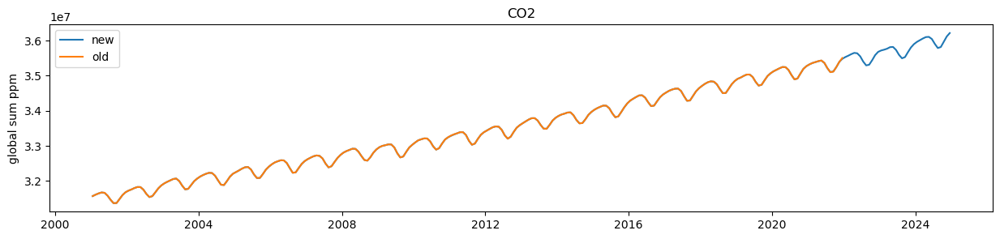

In [58]:
# old-new compare
plt.figure(figsize=(15,3))
old_CO2=xr.load_dataset('/Users/bilir/Desktop/CardamomScratch/MET_DRIVERS_05x05/NOAAGML_CO2_2001-2021.nc')
plt.plot(CO2.time,CO2.CO2.where(LandFrac.data>0.5).sum('latitude').sum('longitude'),label='new')
plt.plot(old_CO2.time,old_CO2.CO2.where(LandFrac.data>0.5).sum('latitude').sum('longitude'),label='old')
plt.title('CO2')
plt.ylabel('global sum ppm')
plt.legend()

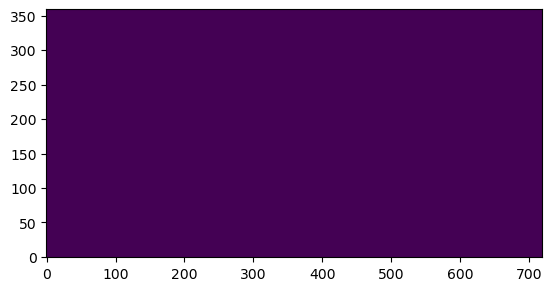

In [55]:
plt.imshow(CO2.CO2.mean('time'),origin='lower') #should look like a solid blob, as all values are spatially the same

In [59]:
CO2=CO2.drop('empty')

/var/folders/l2/3f6sq3tj411_rfqtzc14q89h0000gq/T/ipykernel_58725/2901773540.py:1: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  CO2=CO2.drop('empty')


In [60]:
#Mask to 50% land fraction
CO22=CO2.copy().where(LandFrac.data>0.5)
#CO22.to_netcdf('/Users/bilir/Desktop/CardamomScratch/MET_DRIVERS_05x05/NOAAGML_CO2_2001-2024.nc')

# BURN

In [66]:
BurnGFAS=xr.load_dataset('/Users/bilir/Desktop/CardamomScratch/BURNED_AREA_EXTENSION_FOR_EB_JUN25.nc').transpose()

In [67]:
BurnGFAS['time']=Scaffold.time[24:288]

BurnGFAS

<xarray.Dataset> Size: 7MB
Dimensions:      (lat: 46, lon: 72, time: 264)
Coordinates:
  * time         (time) datetime64[ns] 2kB 2003-01-16T05:15:00 ... 2024-12-16...
  * lon          (lon) float64 576B -180.0 -175.0 -170.0 ... 165.0 170.0 175.0
  * lat          (lat) float64 368B -89.0 -86.0 -82.0 -78.0 ... 82.0 86.0 89.0
Data variables:
    BURNED_AREA  (lat, lon, time) float64 7MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0

In [96]:
BurnGFAS.lon

<xarray.DataArray 'lon' (lon: 72)> Size: 576B
array([-180., -175., -170., -165., -160., -155., -150., -145., -140., -135.,
       -130., -125., -120., -115., -110., -105., -100.,  -95.,  -90.,  -85.,
        -80.,  -75.,  -70.,  -65.,  -60.,  -55.,  -50.,  -45.,  -40.,  -35.,
        -30.,  -25.,  -20.,  -15.,  -10.,   -5.,    0.,    5.,   10.,   15.,
         20.,   25.,   30.,   35.,   40.,   45.,   50.,   55.,   60.,   65.,
         70.,   75.,   80.,   85.,   90.,   95.,  100.,  105.,  110.,  115.,
        120.,  125.,  130.,  135.,  140.,  145.,  150.,  155.,  160.,  165.,
        170.,  175.])
Coordinates:
  * lon      (lon) float64 576B -180.0 -175.0 -170.0 ... 165.0 170.0 175.0

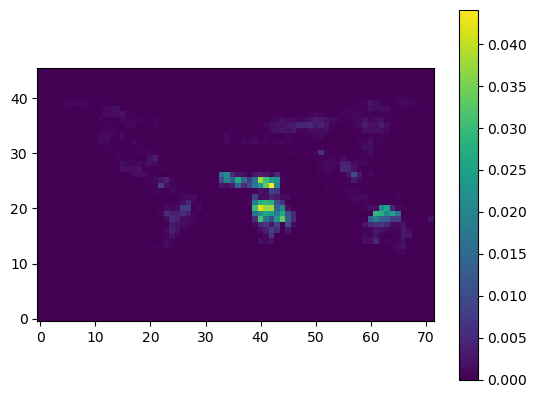

In [69]:
C=plt.imshow(BurnGFAS.BURNED_AREA.mean('time'),origin='lower')
plt.colorbar(C)

# DIST

Sassan's Forest disturbance/degredation product. 

Regridded by me from 0.1deg, with land fraction ignored at 0.1deg but applied at 0.5deg to result in units per-land-area

In [542]:
DIST=xr.load_dataset('/Users/bilir/Desktop/CardamomScratch/MET_DRIVERS_4x5/Yang_forestdisturbance_newvars_05x05.nc')

In [543]:
DIST

<xarray.Dataset>
Dimensions:                                (time: 252, latitude: 360,
                                            longitude: 720, r: 360, c: 720)
Coordinates:
  * time                                   (time) datetime64[ns] 2001-01-16T0...
  * longitude                              (longitude) float64 -179.8 ... 179.8
  * latitude                               (latitude) float64 -89.75 ... 89.75
  * r                                      (r) float64 -89.75 -89.25 ... 89.75
  * c                                      (c) float64 -179.8 -179.3 ... 179.8
Data variables:
    Deforestation                          (time, latitude, longitude) float64 ...
    Degradation                            (time, latitude, longitude) float64 ...
    Fire_Forest                            (time, latitude, longitude) float64 ...
    Fire_Nonforest                         (time, latitude, longitude) float64 ...
    nonfire_disturbance                    (time, latitude, longitude) float64 ...
    forest_and_nonforest_fire_disturbance  (time, latitude, longitude) float64 ...
    LandArea                               (latitude, longitude) float64 1.34...

In [212]:
LandFrac05deg.data.transpose()

<xarray.DataArray 'data' (latitude: 360, longitude: 720)>
array([[ 1.,  1.,  1., ...,  1.,  1.,  1.],
       [ 1.,  1.,  1., ...,  1.,  1.,  1.],
       [ 1.,  1.,  1., ...,  1.,  1.,  1.],
       ...,
       [-0., -0., -0., ...,  0.,  0.,  0.],
       [-0., -0., -0., ...,  0.,  0.,  0.],
       [-0., -0., -0., ...,  0.,  0.,  0.]])
Coordinates:
  * longitude  (longitude) float64 -179.8 -179.2 -178.8 ... 178.8 179.2 179.8
  * latitude   (latitude) float64 -89.75 -89.25 -88.75 ... 88.75 89.25 89.75
Attributes:
    units:          Value= 1: land=100%, sea=0%;Value= 0: land=0%, sea=100%;
    variable_info:  MODIS-based land-sea mask classification for CARDAMOM runs

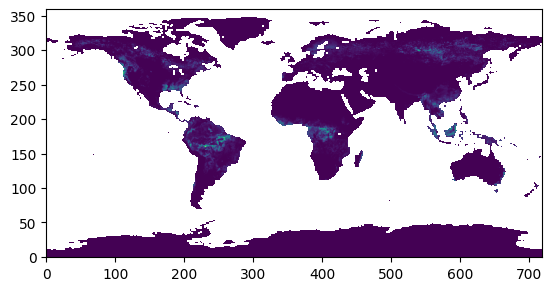

In [194]:
plt.imshow(DIST.nonfire_disturbance.mean('time'),origin='lower')

In [217]:
LandFrac05deg.data.transpose().data

array([[ 1.,  1.,  1., ...,  1.,  1.,  1.],
       [ 1.,  1.,  1., ...,  1.,  1.,  1.],
       [ 1.,  1.,  1., ...,  1.,  1.,  1.],
       ...,
       [-0., -0., -0., ...,  0.,  0.,  0.],
       [-0., -0., -0., ...,  0.,  0.,  0.],
       [-0., -0., -0., ...,  0.,  0.,  0.]])

In [216]:
DIST

<xarray.Dataset>
Dimensions:                                (time: 252, latitude: 360,
                                            longitude: 720)
Coordinates:
  * time                                   (time) datetime64[ns] 2001-01-16T0...
  * longitude                              (longitude) float64 -179.8 ... 179.8
  * latitude                               (latitude) float64 -89.75 ... 89.75
Data variables:
    Deforestation                          (time, latitude, longitude) float64 ...
    Degradation                            (time, latitude, longitude) float64 ...
    Fire_Forest                            (time, latitude, longitude) float64 ...
    Fire_Nonforest                         (time, latitude, longitude) float64 ...
    nonfire_disturbance                    (time, latitude, longitude) float64 ...
    forest_and_nonforest_fire_disturbance  (time, latitude, longitude) float64 ...

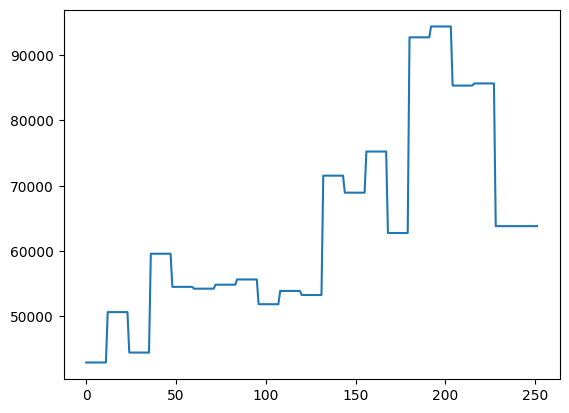

In [221]:
plt.plot(DIST.nonfire_disturbance.sum('latitude').sum('longitude'))

In [544]:
#Mask to 50% land fraction
DIST2=DIST.copy().where(LandFrac05deg.data.data>0.5)

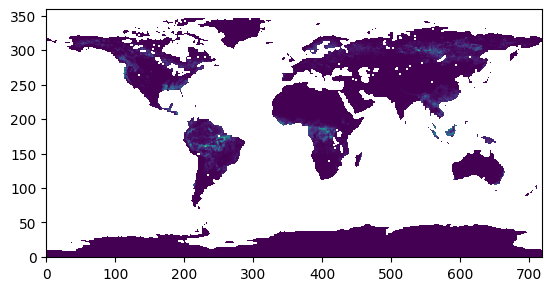

In [444]:
plt.imshow(DIST2.nonfire_disturbance.mean('time'),origin='lower')

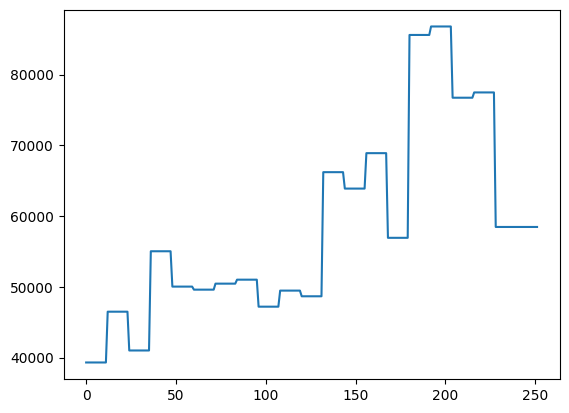

In [222]:
plt.plot(DIST2.nonfire_disturbance.sum('latitude').sum('longitude'))

In [116]:
SCF=Scaffold.copy()

for i in np.arange(len(filelist_SCF)): 
    year=sorted(filelist_SCF)[i][-7:-3]
    print(year)
    dates=SCF.time.isel(time=SCF.time.dt.year.isin(int(year)))
    SCF_temp_raw=xr.open_dataset(sorted(filelist_SCF)[i],decode_times=False)
    SCF_temp=xr.Dataset(data_vars=dict(SCF=(['time','latitude','longitude'], SCF_temp_raw['data'].transpose('time','latitude','longitude').data)),
                      coords={'time':dates.data, 'longitude':SCF_temp_raw.longitude.data,'latitude':SCF_temp_raw.latitude.data})
    SCF=xr.merge([SCF,SCF_temp])

2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021


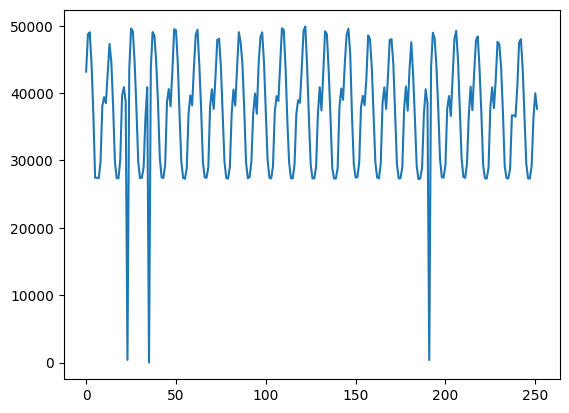

In [117]:
plt.plot(SCF.SCF.sum('latitude').sum('longitude'))

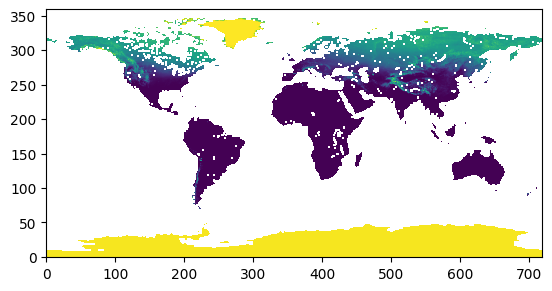

In [118]:
plt.imshow(SCF.SCF.mean('time'),origin='lower')

In [119]:
SCF=SCF.drop('empty')

In [171]:
len(np.where(SCF.SCF>1)[0])

170800

In [452]:
#check for pos-def
np.where(SCF.SCF<0)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))

In [169]:
SCF.SCF.max()

<xarray.DataArray 'SCF' ()>
array(1.)

Text(0.5, 0, 'SCF max wrt time')

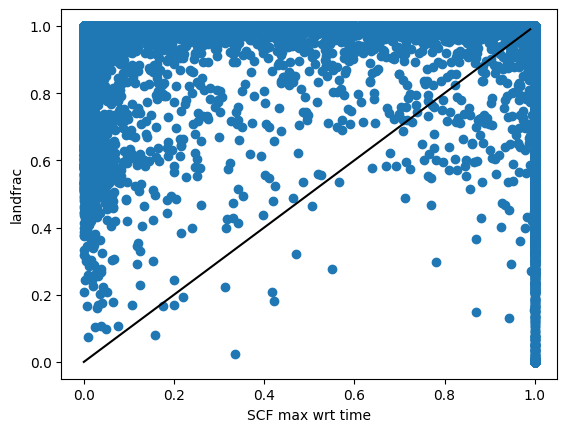

In [418]:
plt.scatter(SCF.SCF.max('time'),LandFrac05deg.data.transpose())
plt.plot(np.arange(0,1,0.01),np.arange(0,1,0.01), color='k')
plt.ylabel('landfrac')
plt.xlabel('SCF max wrt time')

In [172]:
SCF2=SCF.copy()

# Replace values
SCF2['SCF'] = xr.where(SCF.SCF>1, 1, SCF.SCF)

In [445]:
#Mask to 50% land fraction
SCF3=SCF2.copy().where(LandFrac05deg.data>0.5)



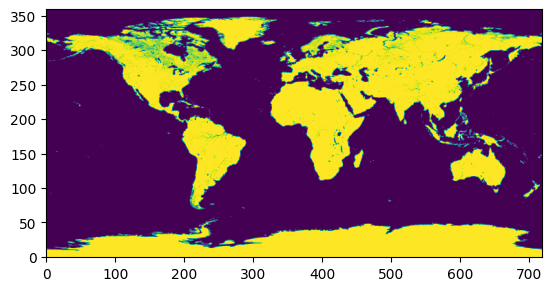

In [413]:
plt.imshow(LandFrac05deg.data.transpose(),origin='lower')

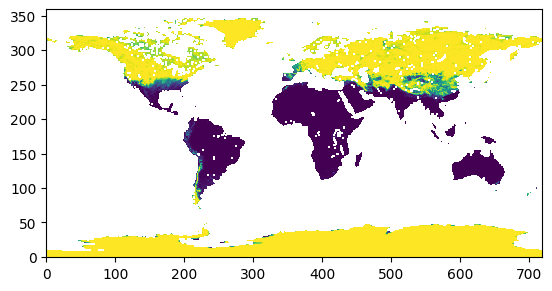

In [412]:
plt.imshow(SCF2['SCF_2'].max('time'),origin='lower')

Text(0.5, 0, 'SCF max wrt time')

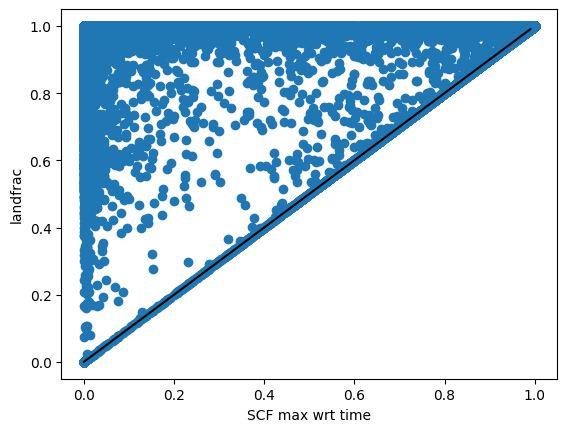

In [417]:
plt.scatter(SCF2.SCF_2.max('time'),LandFrac05deg.data.transpose())
plt.plot(np.arange(0,1,0.01),np.arange(0,1,0.01), color='k')
plt.ylabel('landfrac')
plt.xlabel('SCF max wrt time')

In [173]:
len(np.where(SCF2.SCF>1)[0])

0

In [ ]:
filelist_GPPFluxSat

In [120]:
GPPFluxSat=Scaffold.copy()

for i in np.arange(len(filelist_GPPFluxSat)): 
    year=sorted(filelist_GPPFluxSat)[i][-7:-3]
    print(year)
    dates=GPPFluxSat.time.isel(time=GPPFluxSat.time.dt.year.isin(int(year)))
    GPPFluxSat_temp_raw=xr.open_dataset(sorted(filelist_GPPFluxSat)[i],decode_times=False)
    GPPFluxSat_temp=xr.Dataset(data_vars=dict(GPPFluxSat=(['time','latitude','longitude'], GPPFluxSat_temp_raw['data'].transpose('time','latitude','longitude').data)),
                      coords={'time':dates.data, 'longitude':GPPFluxSat_temp_raw.longitude.data,'latitude':GPPFluxSat_temp_raw.latitude.data})
    GPPFluxSat=xr.merge([GPPFluxSat,GPPFluxSat_temp])

2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019


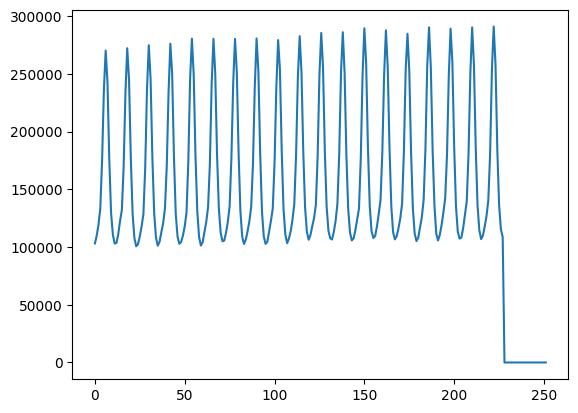

In [121]:
plt.plot(GPPFluxSat.GPPFluxSat.sum('latitude').sum('longitude'))

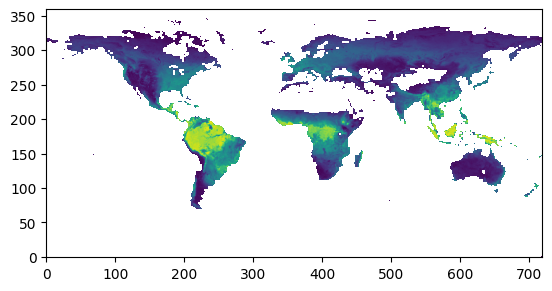

In [122]:
plt.imshow(GPPFluxSat.GPPFluxSat.mean('time'),origin='lower')

In [123]:
GPPFluxSat=GPPFluxSat.drop('empty')

Text(0.5, 0, 'GPP max wrt time')

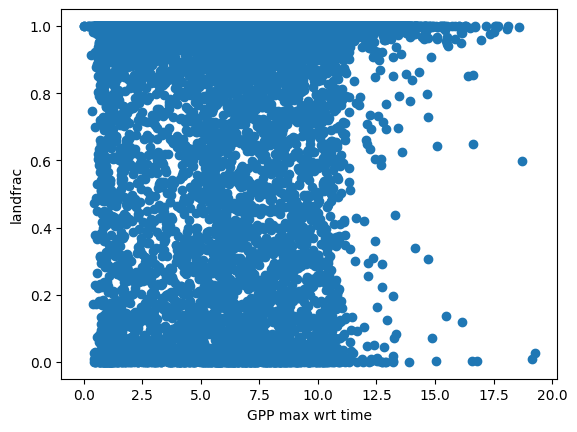

In [32]:
plt.scatter(GPPFluxSat.GPPFluxSat.max('time'),LandFrac05deg.data.where(LandFrac05deg.data>0))
#plt.plot(np.arange(0,1,0.01),np.arange(0,1,0.01), color='k')
plt.ylabel('landfrac')
plt.xlabel('GPP max wrt time')

In [446]:
#Mask to 50% land fraction
GPPFluxSat2=GPPFluxSat.copy().where(LandFrac05deg.data>0.5)



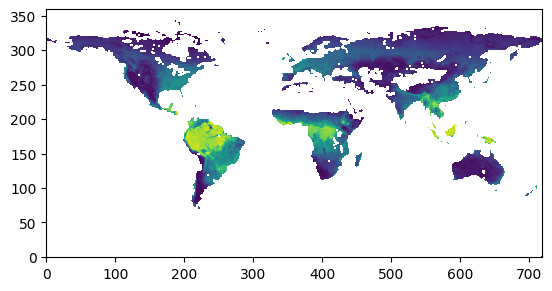

In [447]:
plt.imshow(GPPFluxSat2['GPPFluxSat'].mean('time'),origin='lower')

In [451]:
#check for pos-def
np.where(GPPFluxSat2['GPPFluxSat']<0)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))

In [547]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [43]:
ABGB=Scaffold.copy()

for i in np.arange(len(filelist_ABGB)-1): 
    year=sorted(filelist_ABGB)[i+1][-7:-3]
    print(year)
    dates=ABGB.time.isel(time=ABGB.time.dt.year.isin(int(year)))
    ABGB_temp_raw=xr.open_dataset(sorted(filelist_ABGB)[i+1],decode_times=False)
    ABGB_temp=xr.Dataset(data_vars=dict(ABGB=(['time','latitude','longitude'], ABGB_temp_raw['data'].transpose('time','latitude','longitude').data)),
                      coords={'time':dates.data, 'longitude':ABGB_temp_raw.longitude.data,'latitude':ABGB_temp_raw.latitude.data})
    ABGB=xr.merge([ABGB,ABGB_temp])

2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019


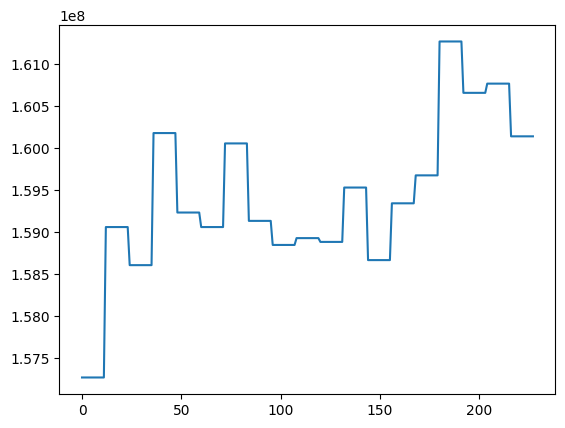

In [45]:
plt.plot(ABGB.ABGB.sum('latitude').sum('longitude')[dict(time=np.arange(252-24))].mean('time'))

In [46]:
ABGB.ABGB.sum('latitude').sum('longitude')[dict(time=np.arange(252-24))].mean('time')

<xarray.DataArray 'ABGB' ()>
array(1.5944026e+08, dtype=float32)

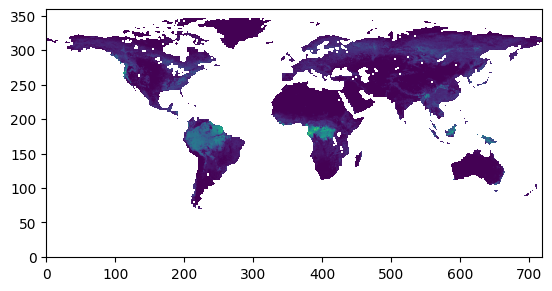

In [125]:
plt.imshow(ABGB.ABGB.mean('time'),origin='lower')

In [48]:
import math
from math import *
#get Area of grid cell at given latitude: follow formula from GEOSChem_xygrids
Areas=(111111.111**2)*(.5*.5)*np.cos(LandFrac05deg.latitude*pi/180)

#Add full grid cell area to arrays:
LandFrac05deg['PixArea']=xr.DataArray(np.repeat(Areas.data,720).reshape(360, 720),
                          coords={'latitude':LandFrac05deg.latitude.data,'longitude':LandFrac05deg.longitude.data,},dims=['latitude','longitude'])


LandFrac05deg['LandArea']=LandFrac05deg['PixArea']*LandFrac05deg['data']



In [49]:
LandFrac05deg

<xarray.Dataset>
Dimensions:    (longitude: 720, latitude: 360)
Coordinates:
  * longitude  (longitude) float64 -179.8 -179.2 -178.8 ... 178.8 179.2 179.8
  * latitude   (latitude) float64 -89.75 -89.25 -88.75 ... 88.75 89.25 89.75
Data variables:
    data       (latitude, longitude) float64 1.0 1.0 1.0 1.0 ... 0.0 0.0 0.0 0.0
    PixArea    (latitude, longitude) float64 1.347e+07 1.347e+07 ... 1.347e+07
    LandArea   (latitude, longitude) float64 1.347e+07 1.347e+07 ... 0.0 0.0

In [53]:
ABGB

<xarray.Dataset>
Dimensions:    (time: 252, longitude: 720, latitude: 360)
Coordinates:
  * time       (time) datetime64[ns] 2001-01-16T05:15:00 ... 2021-12-17T00:45:00
  * longitude  (longitude) float64 -179.8 -179.2 -178.8 ... 178.8 179.2 179.8
  * latitude   (latitude) float64 -89.75 -89.25 -88.75 ... 88.75 89.25 89.75
Data variables:
    ABGB       (time, latitude, longitude) float32 nan nan nan ... nan nan nan

In [52]:
ABGB=ABGB.drop('empty')

In [54]:
ABGB['ABGB_2'] = ABGB.ABGB * LandFrac05deg.LandArea

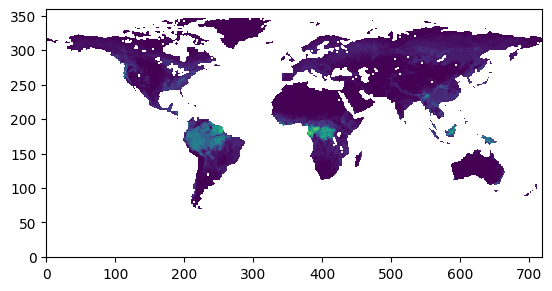

In [55]:
plt.imshow(ABGB['ABGB_2'].mean('time'),origin='lower')

In [56]:
ABGB['ABGB_2'].sum('latitude').sum('longitude').mean('time')

<xarray.DataArray 'ABGB_2' ()>
array(3.29980859e+17)

In [57]:
#Mask to 50% land fraction
ABGB2=ABGB.copy().where(LandFrac05deg.data>0.5)



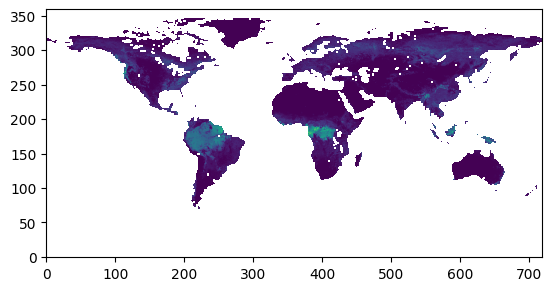

In [449]:
plt.imshow(ABGB2['ABGB'].mean('time'),origin='lower')

In [450]:
#check for pos-def
np.where(ABGB2.ABGB<0)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))

In [110]:
sorted(filelist_MsSIF)

['/Users/bilir/Desktop/CardamomScratch/ObsDrivers05x05/CORNELLSIFGPP/CARDAMOM-MAPS_05deg_MEaSUREs_SIF_GPP_2002.nc',
 '/Users/bilir/Desktop/CardamomScratch/ObsDrivers05x05/CORNELLSIFGPP/CARDAMOM-MAPS_05deg_MEaSUREs_SIF_GPP_2003.nc',
 '/Users/bilir/Desktop/CardamomScratch/ObsDrivers05x05/CORNELLSIFGPP/CARDAMOM-MAPS_05deg_MEaSUREs_SIF_GPP_2004.nc',
 '/Users/bilir/Desktop/CardamomScratch/ObsDrivers05x05/CORNELLSIFGPP/CARDAMOM-MAPS_05deg_MEaSUREs_SIF_GPP_2005.nc',
 '/Users/bilir/Desktop/CardamomScratch/ObsDrivers05x05/CORNELLSIFGPP/CARDAMOM-MAPS_05deg_MEaSUREs_SIF_GPP_2006.nc',
 '/Users/bilir/Desktop/CardamomScratch/ObsDrivers05x05/CORNELLSIFGPP/CARDAMOM-MAPS_05deg_MEaSUREs_SIF_GPP_2007.nc',
 '/Users/bilir/Desktop/CardamomScratch/ObsDrivers05x05/CORNELLSIFGPP/CARDAMOM-MAPS_05deg_MEaSUREs_SIF_GPP_2008.nc',
 '/Users/bilir/Desktop/CardamomScratch/ObsDrivers05x05/CORNELLSIFGPP/CARDAMOM-MAPS_05deg_MEaSUREs_SIF_GPP_2009.nc',
 '/Users/bilir/Desktop/CardamomScratch/ObsDrivers05x05/CORNELLSIFGPP/CAR

In [127]:
MsSIF=Scaffold.copy()

for i in np.arange(len(filelist_MsSIF)): 
    year=sorted(filelist_MsSIF)[i][-7:-3]
    print(year)
    dates=MsSIF.time.isel(time=MsSIF.time.dt.year.isin(int(year)))
    MsSIF_temp_raw=xr.open_dataset(sorted(filelist_MsSIF)[i],decode_times=False)
    MsSIF_temp=xr.Dataset(data_vars=dict(MsSIF=(['time','latitude','longitude'], MsSIF_temp_raw['data'].transpose('time','latitude','longitude').data)),
                      coords={'time':dates.data, 'longitude':MsSIF_temp_raw.longitude.data,'latitude':MsSIF_temp_raw.latitude.data})
    MsSIF=xr.merge([MsSIF,MsSIF_temp])

2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018


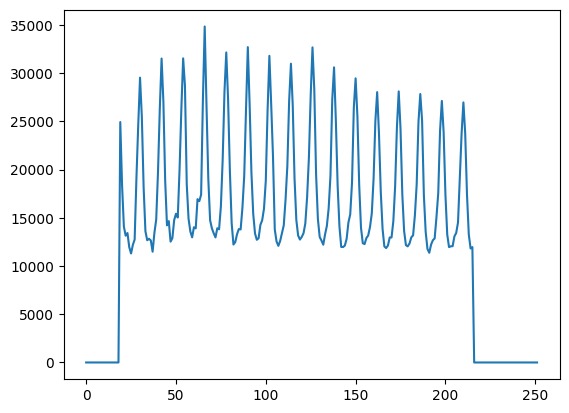

In [128]:
plt.plot(MsSIF.MsSIF.sum('latitude').sum('longitude'))

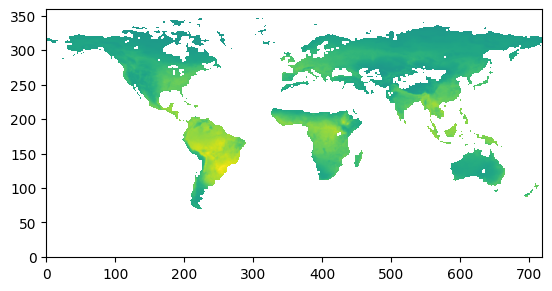

In [129]:
plt.imshow(MsSIF.MsSIF.mean('time'),origin='lower')

In [130]:
MsSIF=MsSIF.drop('empty')

In [457]:
#check for pos-def
len(np.where(MsSIF.MsSIF<0)[0])/(360*720*252)

0.030144078850676072

In [454]:
MsSIF.MsSIF.min()

<xarray.DataArray 'MsSIF' ()>
array(-19.357086, dtype=float32)

(0.0, 4.0)

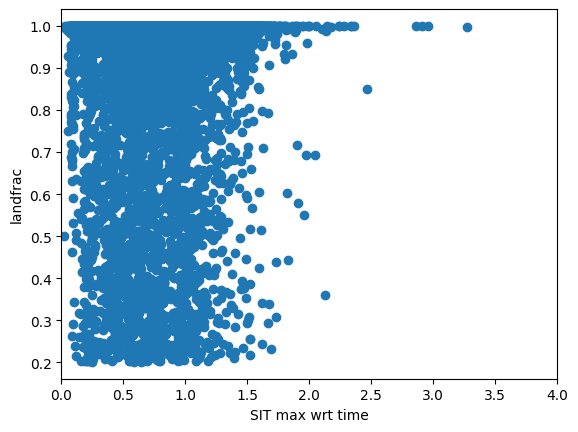

In [39]:
plt.scatter(MsSIF.MsSIF.max('time'),LandFrac05deg.data.where(LandFrac05deg.data>0.2))
#plt.plot(np.arange(0,1,0.01),np.arange(0,1,0.01), color='k')
plt.ylabel('landfrac')
plt.xlabel('SIT max wrt time')
plt.xlim(0,4)

In [183]:
MsSIF['MsSIF_2'] = MsSIF.MsSIF * LandFrac05deg.data.transpose()

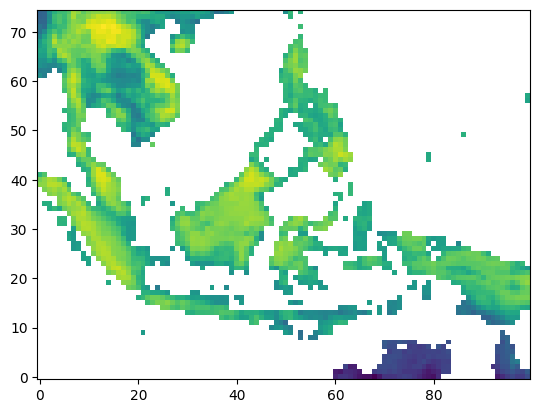

In [52]:
plt.imshow(MsSIF.MsSIF.mean('time')[dict(longitude=np.arange(550,650),latitude=np.arange(150,225))],origin='lower')

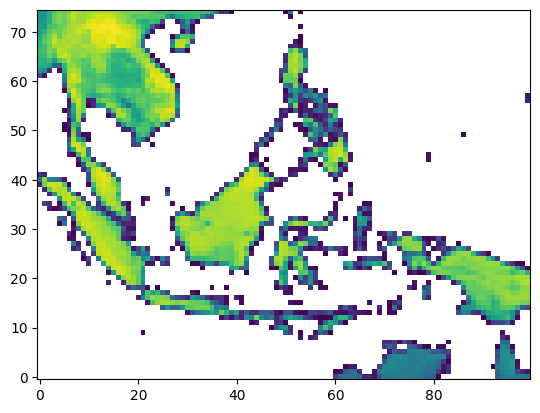

In [184]:
plt.imshow(MsSIF.MsSIF_2.mean('time')[dict(longitude=np.arange(550,650),latitude=np.arange(150,225))],origin='lower')

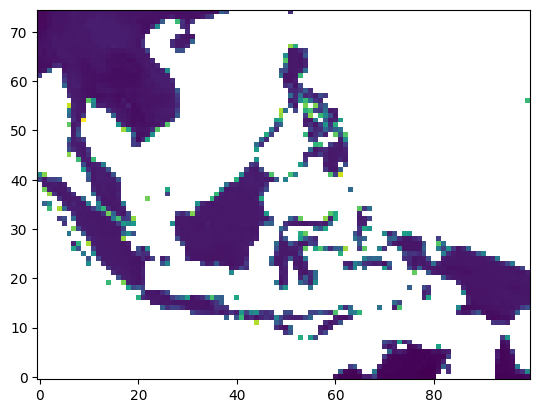

In [54]:
plt.imshow(MsSIF.MsSIF.mean('time')[dict(longitude=np.arange(550,650),latitude=np.arange(150,225))]/LandFrac05deg.data[dict(longitude=np.arange(550,650),latitude=np.arange(150,225))].where(LandFrac05deg.data>0.1).transpose(),origin='lower')

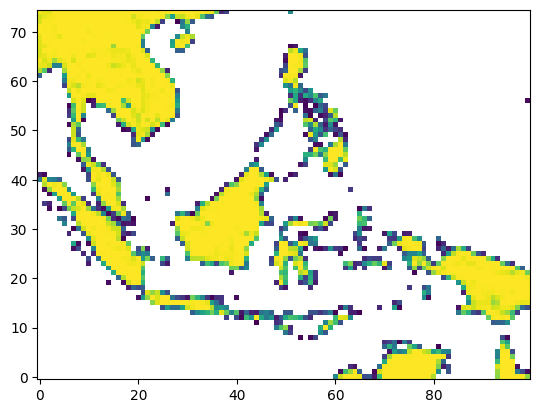

In [55]:
plt.imshow(LandFrac05deg.data[dict(longitude=np.arange(550,650),latitude=np.arange(150,225))].transpose().where(LandFrac05deg.data>0.1),origin='lower')

In [131]:
EWTUNC=Scaffold.copy()

for i in np.arange(len(filelist_EWTUNC)): 
    year=sorted(filelist_EWTUNC)[i][-7:-3]
    print(year)
    dates=EWTUNC.time.isel(time=EWTUNC.time.dt.year.isin(int(year)))
    EWTUNC_temp_raw=xr.open_dataset(sorted(filelist_EWTUNC)[i],decode_times=False)
    EWTUNC_temp=xr.Dataset(data_vars=dict(EWTUNC=(['time','latitude','longitude'], EWTUNC_temp_raw['data'].transpose('time','latitude','longitude').data)),
                      coords={'time':dates.data, 'longitude':EWTUNC_temp_raw.longitude.data,'latitude':EWTUNC_temp_raw.latitude.data})
    EWTUNC=xr.merge([EWTUNC,EWTUNC_temp])

2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021


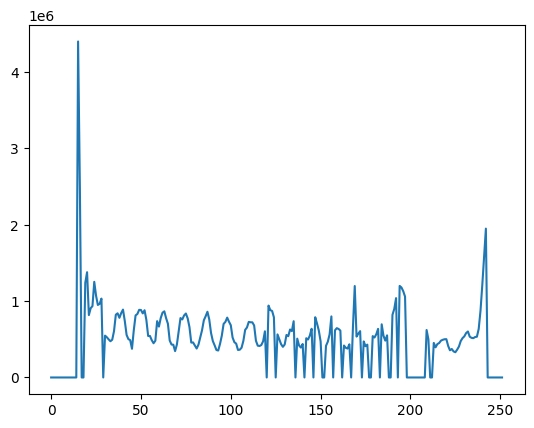

In [132]:
plt.plot(EWTUNC.EWTUNC.sum('latitude').sum('longitude'))

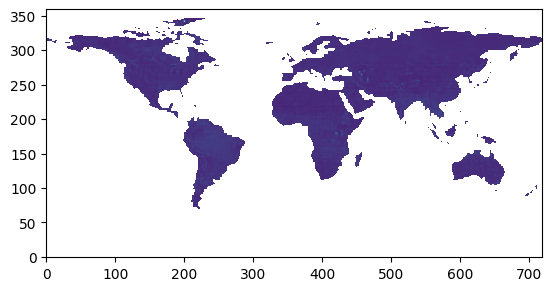

In [133]:
plt.imshow(EWTUNC.EWTUNC.mean('time'),origin='lower')

In [134]:
EWTUNC=EWTUNC.drop('empty')

In [135]:
ModLAI=Scaffold.copy()

for i in np.arange(len(filelist_ModLAI)): 
    year=sorted(filelist_ModLAI)[i][-7:-3]
    print(year)
    dates=ModLAI.time.isel(time=ModLAI.time.dt.year.isin(int(year)))
    ModLAI_temp_raw=xr.open_dataset(sorted(filelist_ModLAI)[i],decode_times=False)
    ModLAI_temp=xr.Dataset(data_vars=dict(ModLAI=(['time','latitude','longitude'], ModLAI_temp_raw['data'].transpose('time','latitude','longitude').data)),
                      coords={'time':dates.data, 'longitude':ModLAI_temp_raw.longitude.data,'latitude':ModLAI_temp_raw.latitude.data})
    ModLAI=xr.merge([ModLAI,ModLAI_temp])

2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016


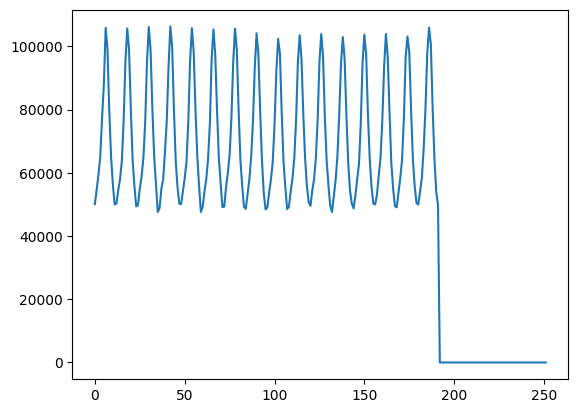

In [136]:
plt.plot(ModLAI.ModLAI.sum('latitude').sum('longitude'))

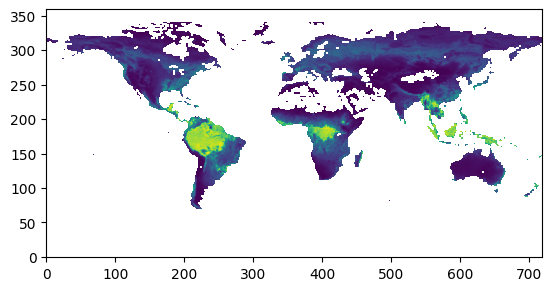

In [137]:
plt.imshow(ModLAI.ModLAI.mean('time'),origin='lower')

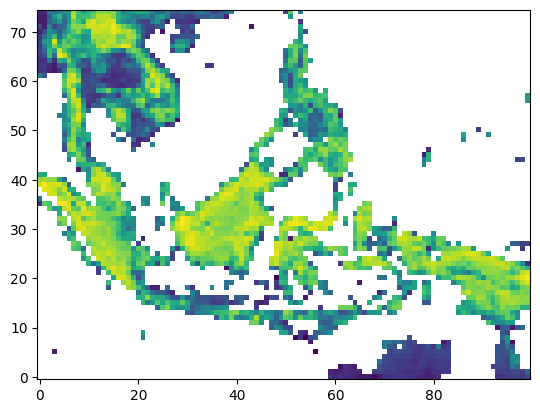

In [44]:
plt.imshow(ModLAI.ModLAI.mean('time')[dict(longitude=np.arange(550,650),latitude=np.arange(150,225))],origin='lower')

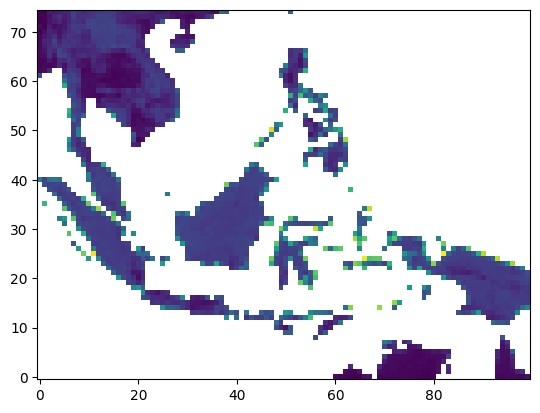

In [57]:
plt.imshow(ModLAI.ModLAI.mean('time')[dict(longitude=np.arange(550,650),latitude=np.arange(150,225))]/LandFrac05deg.data[dict(longitude=np.arange(550,650),latitude=np.arange(150,225))].where(LandFrac05deg.data>0.2),origin='lower')

In [138]:
ModLAI=ModLAI.drop('empty')

Text(0.5, 0, 'LAI max wrt time')

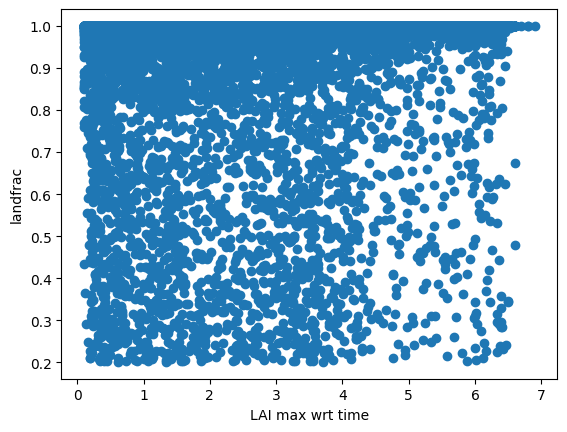

In [42]:
plt.scatter(ModLAI.ModLAI.max('time'),LandFrac05deg.data.where(LandFrac05deg.data>0.2))
#plt.plot(np.arange(0,1,0.01),np.arange(0,1,0.01), color='k')
plt.ylabel('landfrac')
plt.xlabel('LAI max wrt time')
#plt.xlim(0,4)

In [458]:
ModLAI2= ModLAI.copy().where(LandFrac05deg.data>.5)

In [460]:
np.where(ModLAI2.ModLAI<0)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))

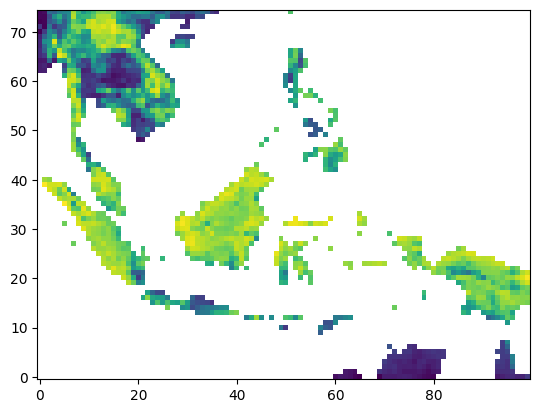

In [459]:
plt.imshow(ModLAI2.ModLAI.mean('time')[dict(longitude=np.arange(550,650),latitude=np.arange(150,225))],origin='lower')

In [102]:
sorted(filelist_GPP)[0]

'/Users/bilir/Desktop/CardamomScratch/ObsDrivers05x05/GPP/CARDAMOM-MAPS_05deg_CSIF_GPP_2000.nc'

In [103]:
np.arange(len(filelist_GPP)-1)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19])

In [100]:
GPP_temp_raw=xr.open_dataset(sorted(filelist_GPP)[0],decode_times=False)

In [107]:
AllObs05x05=xr.open_dataset('/Users/bilir/Desktop/CardamomScratch/ObsDrivers05x05/AlltsObs05x05.nc')
Obs2=AllObs05x05.rename({'GPP':'CSIF', 'ModLAI':'LAI','MsSIF':'SIF','GPPFluxSat':'GPP'})

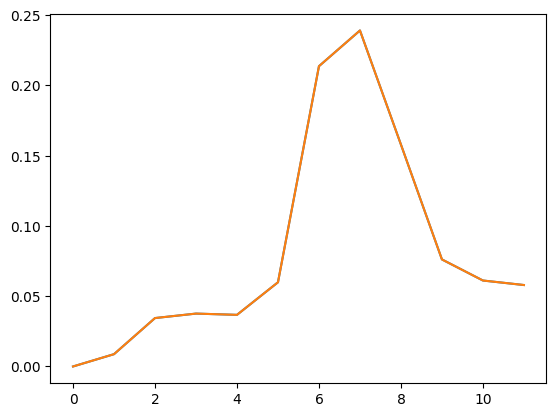

In [108]:
plt.plot(GPP_temp_raw.data[dict(latitude=np.where(GPP_temp_raw.latitude==30.75)[0][0],
              longitude=np.where(GPP_temp_raw.longitude==-110.25)[0][0])])
plt.plot(Obs2.CSIF[dict(latitude=np.where(Obs2.latitude==30.75)[0][0],
              longitude=np.where(Obs2.longitude==-110.25)[0][0],time=np.arange(12))])

In [139]:
GPP=Scaffold.copy()

for i in np.arange(len(filelist_GPP)-1): 
    year=sorted(filelist_GPP)[i+1][-7:-3]
    print(year)
    dates=GPP.time.isel(time=GPP.time.dt.year.isin(int(year)))
    GPP_temp_raw=xr.open_dataset(sorted(filelist_GPP)[i+1],decode_times=False)
    GPP_temp=xr.Dataset(data_vars=dict(GPP=(['time','latitude','longitude'], GPP_temp_raw['data'].transpose('time','latitude','longitude').data)),
                      coords={'time':dates.data, 'longitude':GPP_temp_raw.longitude.data,'latitude':GPP_temp_raw.latitude.data})
    GPP=xr.merge([GPP,GPP_temp])

2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020


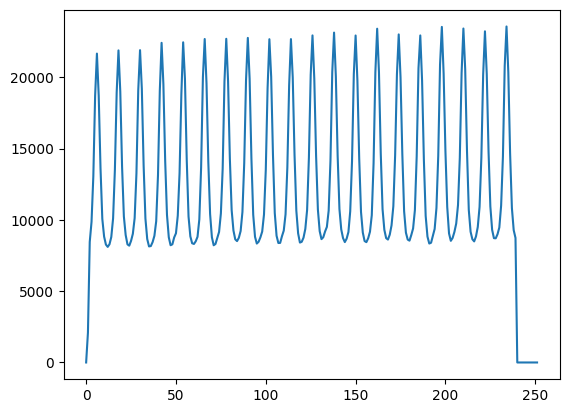

In [140]:
plt.plot(GPP.GPP.sum('latitude').sum('longitude'))

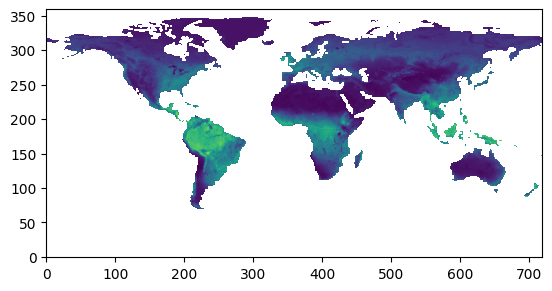

In [141]:
plt.imshow(GPP.GPP.mean('time'),origin='lower')

In [142]:
GPP=GPP.drop('empty')

In [188]:
GPP['GPP_2'] = GPP.GPP * LandFrac05deg.data.transpose()

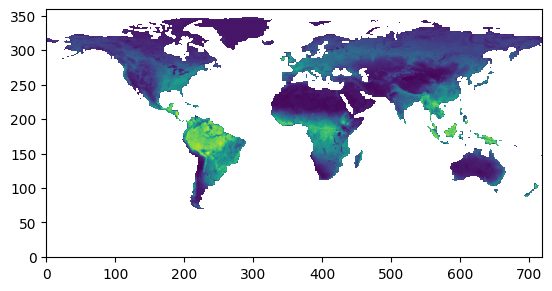

In [189]:
plt.imshow(GPP.GPP_2.mean('time'),origin='lower')

In [213]:
GPP

<xarray.Dataset>
Dimensions:    (time: 252, longitude: 720, latitude: 360)
Coordinates:
  * time       (time) datetime64[ns] 2001-01-16T05:15:00 ... 2021-12-17T00:45:00
  * longitude  (longitude) float64 -179.8 -179.2 -178.8 ... 178.8 179.2 179.8
  * latitude   (latitude) float64 -89.75 -89.25 -88.75 ... 88.75 89.25 89.75
Data variables:
    GPP        (time, latitude, longitude) float32 nan nan nan ... nan nan nan
    GPP_2      (time, latitude, longitude) float64 nan nan nan ... nan nan nan

In [98]:
EWT_temp_raw=xr.open_dataset(sorted(filelist_EWT)[0],decode_times=False)

In [99]:
EWT_temp_raw

<xarray.Dataset>
Dimensions:    (latitude: 360, longitude: 720, time: 12)
Coordinates:
  * latitude   (latitude) float64 -89.75 -89.25 -88.75 ... 88.75 89.25 89.75
  * longitude  (longitude) float64 -179.8 -179.2 -178.8 ... 178.8 179.2 179.8
  * time       (time) int32 1 2 3 4 5 6 7 8 9 10 11 12
Data variables:
    data       (time, longitude, latitude) float32 ...
Attributes:
    Conventions:  CF-1.4
    created_by:   R, packages ncdf4 and raster (version 3.1-5)
    date:         2021-08-30 19:29:10

In [143]:
EWT=Scaffold.copy()

for i in np.arange(len(filelist_EWT)): 
    year=sorted(filelist_EWT)[i][-7:-3]
    print(year)
    dates=EWT.time.isel(time=EWT.time.dt.year.isin(int(year)))
    EWT_temp_raw=xr.open_dataset(sorted(filelist_EWT)[i],decode_times=False)
    EWT_temp=xr.Dataset(data_vars=dict(EWT=(['time','latitude','longitude'], EWT_temp_raw['data'].transpose('time','latitude','longitude').data)),
                      coords={'time':dates.data, 'longitude':EWT_temp_raw.longitude.data,'latitude':EWT_temp_raw.latitude.data})
    EWT=xr.merge([EWT,EWT_temp])

2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021


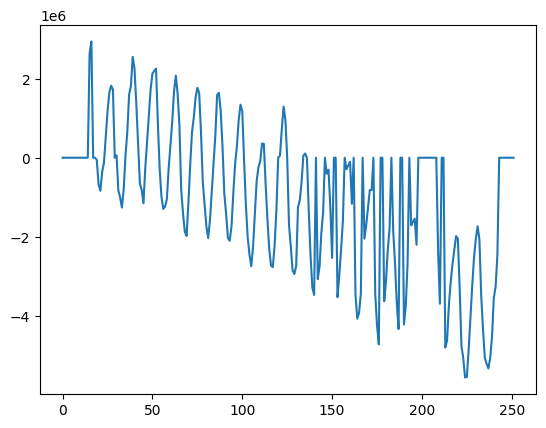

In [144]:
plt.plot(EWT.EWT.sum('latitude').sum('longitude'))

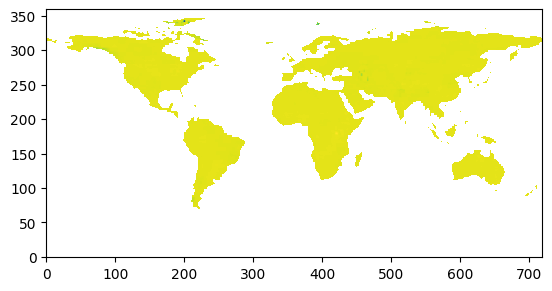

In [145]:
plt.imshow(EWT.EWT.mean('time'),origin='lower')

In [146]:
EWT=EWT.drop('empty')

In [461]:
EWT2= EWT.copy().where(LandFrac05deg.data>.5)